# Mise en place des outils de predictions sur les différentes bases :

In [1]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_selection import chi2
import numpy as np
import pandas as pd
import seaborn as sns

from sklearn.linear_model import SGDClassifier
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression

from sklearn.model_selection import GridSearchCV

from sklearn.utils import resample
from sklearn.utils import shuffle
from wordcloud import WordCloud

import matplotlib.pyplot as plt
import NLP_plots_models

## Imports des bases de données :

In [2]:
#Base de données relative à l'article #Elysée2017:
df_tweets_elysee=pd.read_csv('Donnees_clean/twitter/tweets/tweets_elysee_2017.csv')
#Base de données relative aux parlementaires :
df_tweets_parlementaires=pd.read_csv('Donnees_clean/twitter/tweets/tweets_parlementaires.csv')

On peut directement importer les donnéess pre-traitées:

In [4]:
#Base de données relative à l'article #Elysée2017:
df_tweets_elysee=pd.read_csv('Donnees_clean/Models/Elysee_Lemma_partis.csv')
#Base de données relative aux parlementaires :
df_tweets_parlementaires=pd.read_csv('Donnees_clean/Models/Parlementaires_Lemma_partis.csv')

## #Elysée2017

### Description des données :

In [3]:
print('tous les partis de la base : ', df_tweets_elysee.party.unique())
partis=['em', 'ps', 'fi', 'lr', 'fn']
df_tweets_elysee = df_tweets_elysee[df_tweets_elysee.party.isin(partis)]
print("Les partis considérés : ", df_tweets_elysee.party.unique())

tous les partis de la base :  ['em' 'ps' 'fi' 'em/lr' 'lr' 'fn' 'em/ps' 'fn/lr' 'fi/ps' 'em/fi' 'fi/fn'
 'lr/ps' 'fn/ps' 'fi/lr']
Les partis considérés :  ['em' 'ps' 'fi' 'lr' 'fn']


### Preprocessing :

On applique une lemmatisation en plus des processus de pre-processing classiques

In [44]:
df_tweets_elysee['tweets'] = df_tweets_elysee['tweets'].astype('str').apply(NLP_plots_models.clean_text_lemma)

On enregistre le preprocessing : 

In [45]:
df_tweets_elysee.to_csv('Donnees_clean/Models/Elysee_lemma_partis.csv', index=False)

### TFIDF :

In [5]:
# Initializing TFIDF :
tfidf = TfidfVectorizer(sublinear_tf=True, min_df=5, norm='l2', encoding='latin-1', ngram_range=(1, 2))
#Attributs :
features = tfidf.fit_transform(df_tweets_elysee.tweets).toarray()
#Labels :
labels = df_tweets_elysee.party

### Pie chart des partis :

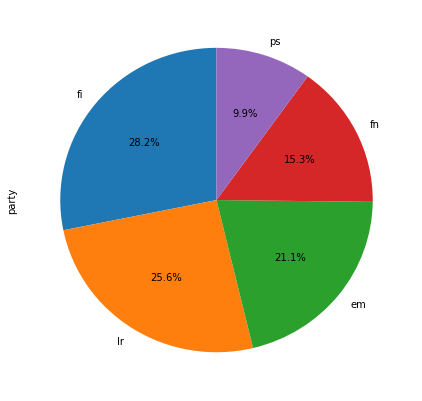

True

In [6]:
NLP_plots_models.partis_pie_chart(labels)

### Correlations :

In [7]:
NLP_plots_models.correlations_uni_bi_grams(features, labels, tfidf)

For the party : 'em':
  . Most correlated unigrams:
. jevotemacron
. enmarche
  . Most correlated bigrams:
. enmarche macron
. macron enmarche
For the party : 'ps':
  . Most correlated unigrams:
. benoit
. hamon
  . Most correlated bigrams:
. benoit hamon
. hamon primaireledebat
For the party : 'fi':
  . Most correlated unigrams:
. franceinsoumise
. jlm
  . Most correlated bigrams:
. sansmoile mai
. france insoumise
For the party : 'lr':
  . Most correlated unigrams:
. fillonpresident
. jevotefillon
  . Most correlated bigrams:
. lemissionpolitique jevotefillon
. francois fillon
For the party : 'fn':
  . Most correlated unigrams:
. patriote
. marine
  . Most correlated bigrams:
. marine officiel
. officiel officiel


True

### Application des modèles :

------------- SGDClassifier ----------------------------------------
              precision    recall  f1-score   support

          em       0.95      0.34      0.50       929
          ps       0.94      0.19      0.32       457
          fi       0.56      0.93      0.70      1221
          lr       0.62      0.81      0.70      1174
          fn       0.81      0.56      0.67       720

    accuracy                           0.64      4501
   macro avg       0.77      0.57      0.58      4501
weighted avg       0.73      0.64      0.61      4501



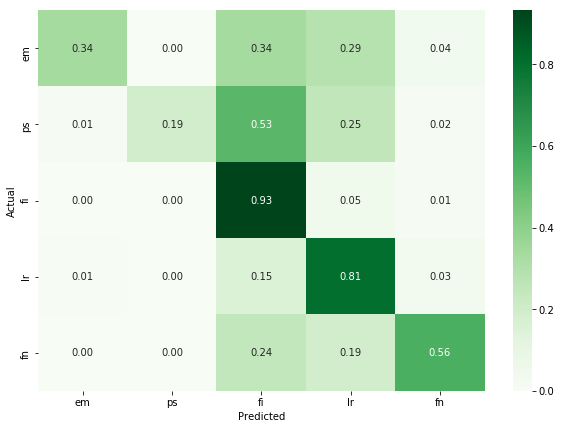

------------- RandomForestClassifier ----------------------------------------


C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

          em       1.00      0.02      0.03       929
          ps       0.00      0.00      0.00       457
          fi       0.30      1.00      0.47      1221
          lr       0.73      0.30      0.43      1174
          fn       0.00      0.00      0.00       720

    accuracy                           0.35      4501
   macro avg       0.41      0.26      0.19      4501
weighted avg       0.48      0.35      0.24      4501



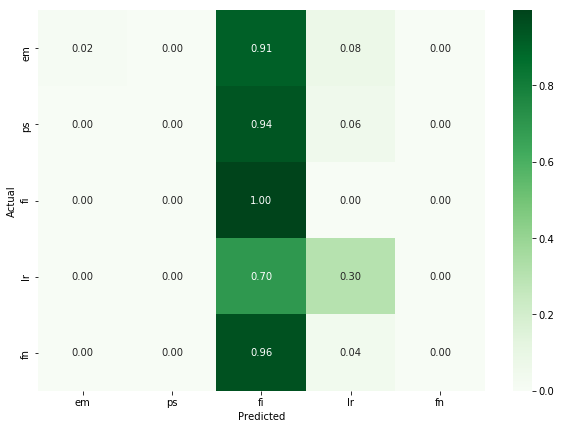

------------- LinearSVC ----------------------------------------
              precision    recall  f1-score   support

          em       0.63      0.59      0.61       929
          ps       0.75      0.35      0.48       457
          fi       0.64      0.83      0.72      1221
          lr       0.70      0.72      0.71      1174
          fn       0.74      0.64      0.68       720

    accuracy                           0.67      4501
   macro avg       0.69      0.63      0.64      4501
weighted avg       0.68      0.67      0.67      4501



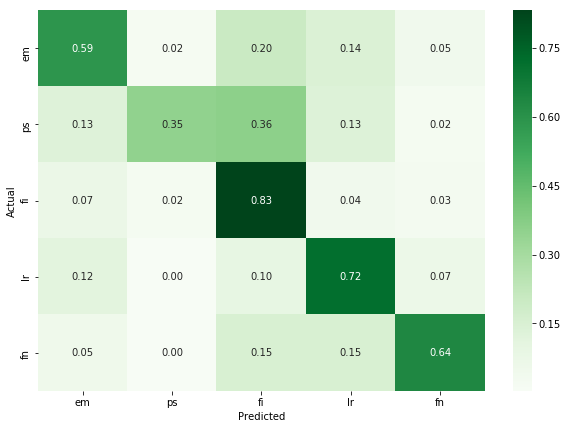

------------- MultinomialNB ----------------------------------------
              precision    recall  f1-score   support

          em       0.92      0.24      0.39       929
          ps       1.00      0.00      0.01       457
          fi       0.44      0.98      0.61      1221
          lr       0.54      0.69      0.61      1174
          fn       0.94      0.04      0.08       720

    accuracy                           0.50      4501
   macro avg       0.77      0.39      0.34      4501
weighted avg       0.70      0.50      0.42      4501



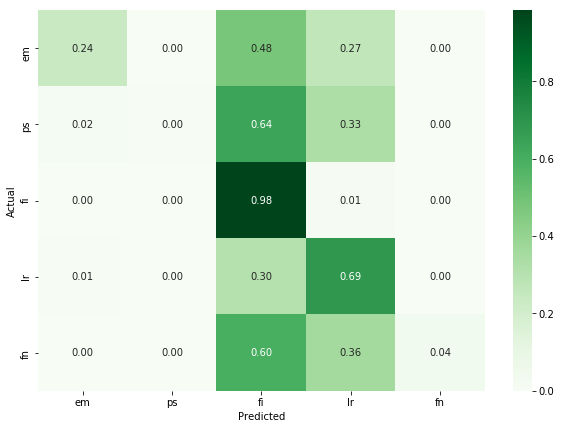

C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

------------- LogisticRegression ----------------------------------------
              precision    recall  f1-score   support

          em       0.71      0.52      0.60       929
          ps       0.94      0.19      0.32       457
          fi       0.57      0.92      0.71      1221
          lr       0.68      0.76      0.72      1174
          fn       0.82      0.55      0.66       720

    accuracy                           0.66      4501
   macro avg       0.75      0.59      0.60      4501
weighted avg       0.71      0.66      0.64      4501



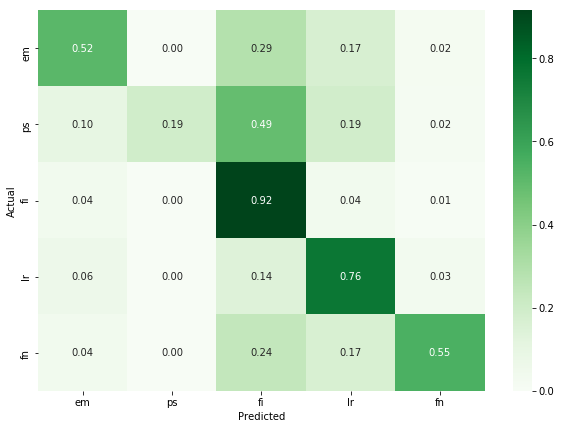

------------- DecisionTreeClassifier ----------------------------------------
              precision    recall  f1-score   support

          em       0.83      0.18      0.29       929
          ps       0.76      0.04      0.07       457
          fi       0.47      0.62      0.54      1221
          lr       0.37      0.78      0.50      1174
          fn       0.77      0.22      0.34       720

    accuracy                           0.45      4501
   macro avg       0.64      0.37      0.35      4501
weighted avg       0.60      0.45      0.40      4501



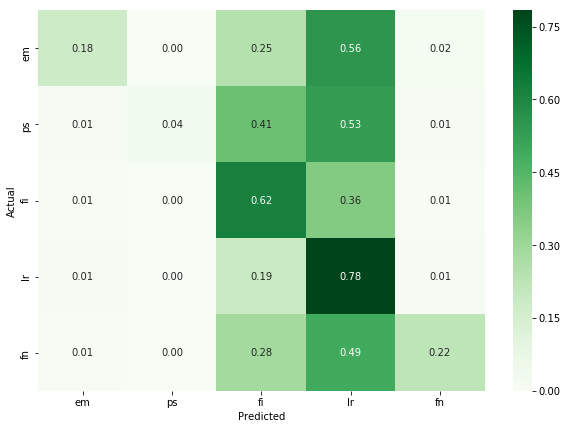

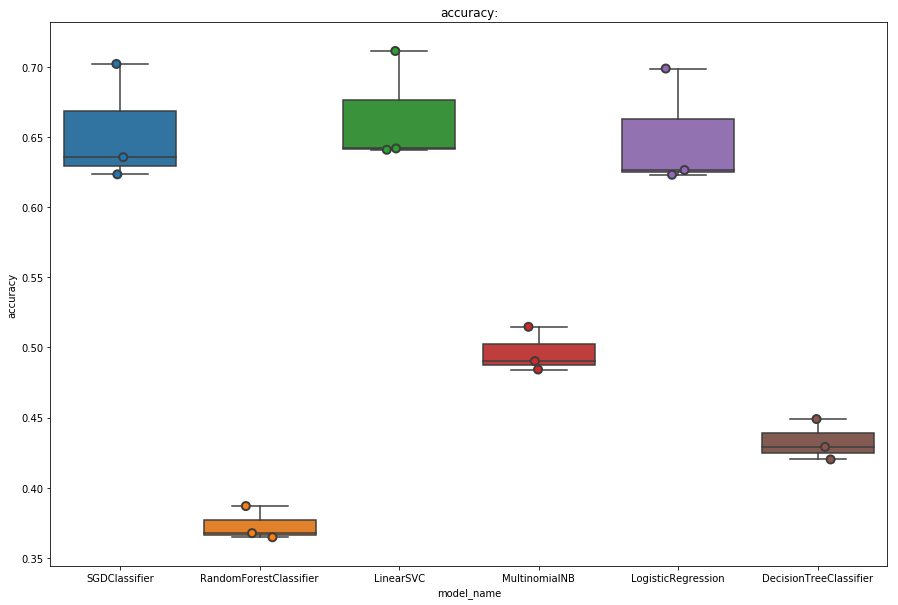

Accuracy:
model_name
DecisionTreeClassifier    0.432722
LinearSVC                 0.664817
LogisticRegression        0.649565
MultinomialNB             0.496447
RandomForestClassifier    0.373032
SGDClassifier             0.653819
Name: accuracy, dtype: float64


True

In [8]:
NLP_plots_models.multi_models_test(features, labels, CV=3)

### Over-sampling:

Partis considérés: 
'em' 'ps' 'fi' 'lr' 'fn'

In [5]:
# separate minority and majority classes
Em = df_tweets_elysee[df_tweets_elysee.party=='em']
Ps = df_tweets_elysee[df_tweets_elysee.party=='ps']
Fi = df_tweets_elysee[df_tweets_elysee.party=='fi']
Lr = df_tweets_elysee[df_tweets_elysee.party=='lr']
Fn = df_tweets_elysee[df_tweets_elysee.party=='fn']

# upsample minority 'ps'
Ps_upsampled = resample(Ps,
                          replace=True, # sample with replacement
                          n_samples=len(Em), # match number in majority class
                          random_state=27) # reproducible results
# upsample minority 'fi'
Fi_upsampled = resample(Fi,
                          replace=True, # sample with replacement
                          n_samples=len(Em), # match number in majority class
                          random_state=27) # reproducible results
# upsample minority 'lr'
Lr_upsampled = resample(Lr,
                          replace=True, # sample with replacement
                          n_samples=len(Em), # match number in majority class
                          random_state=27) # reproducible results
# upsample minority 'fi'
Fn_upsampled = resample(Fn,
                          replace=True, # sample with replacement
                          n_samples=len(Em), # match number in majority class
                          random_state=27) # reproducible results


In [6]:
# combine majority and upsampled minority
upsampled_partis_elysee = pd.concat([Em, Ps_upsampled, Fi_upsampled, Lr_upsampled, Fn_upsampled])
# On Shuffle le dataset:
upsampled_partis_elysee = shuffle(upsampled_partis_elysee)

In [7]:
print('Nombre d\'individus dans la base upsmapled:',upsampled_partis_elysee.shape[0])

print("Nombre de Ps dans le set upsampled ", upsampled_partis_elysee[upsampled_partis_elysee.party=='ps'].shape[0])
print("Nombre de Em dans le set upsampled ", upsampled_partis_elysee[upsampled_partis_elysee.party=='em'].shape[0])
print("Nombre de Fi dans le set upsampled ", upsampled_partis_elysee[upsampled_partis_elysee.party=='fi'].shape[0])
print("Nombre de Lr dans le set upsampled ", upsampled_partis_elysee[upsampled_partis_elysee.party=='lr'].shape[0])
print("Nombre de Fn dans le set upsampled ", upsampled_partis_elysee[upsampled_partis_elysee.party=='fn'].shape[0])

Nombre d'individus dans la base upsmapled: 14355
Nombre de Ps dans le set upsampled  2871
Nombre de Em dans le set upsampled  2871
Nombre de Fi dans le set upsampled  2871
Nombre de Lr dans le set upsampled  2871
Nombre de Fn dans le set upsampled  2871


On a maintenant un set intitulé `upsampled` contenant le même nombre de chaque parti.

In [8]:
# Initializing TFIDF :
tfidf = TfidfVectorizer(sublinear_tf=True, min_df=5, norm='l2', encoding='latin-1', ngram_range=(1, 2))
#Attributs :
features = tfidf.fit_transform(upsampled_partis_elysee.tweets).toarray()
#Labels :
labels = upsampled_partis_elysee.party

ValueError: np.nan is an invalid document, expected byte or unicode string.

Vérification via Pie Chart :

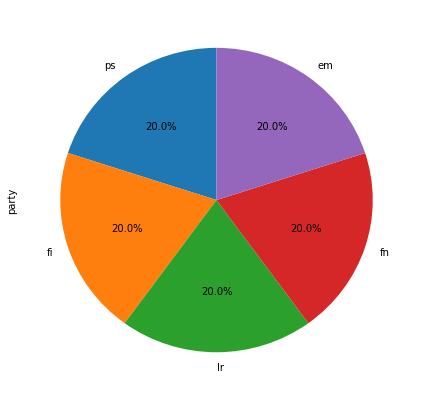

True

In [19]:
NLP_plots_models.partis_pie_chart(labels)

------------- SGDClassifier ----------------------------------------
              precision    recall  f1-score   support

          ps       0.76      0.90      0.82       970
          em       0.76      0.58      0.66       949
          lr       0.72      0.84      0.77       944
          fi       0.88      0.66      0.76       948
          fn       0.77      0.88      0.82       927

    accuracy                           0.77      4738
   macro avg       0.78      0.77      0.77      4738
weighted avg       0.78      0.77      0.77      4738



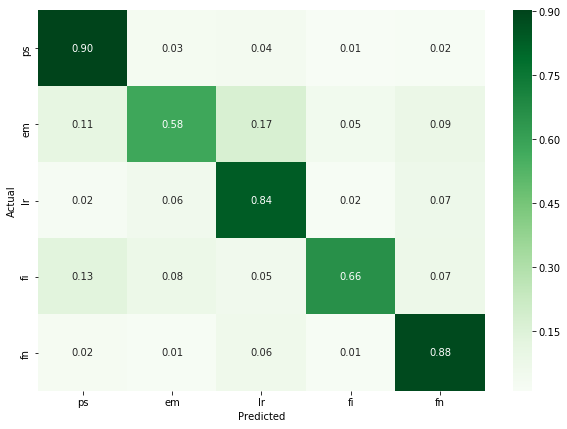

------------- RandomForestClassifier ----------------------------------------
              precision    recall  f1-score   support

          ps       0.73      0.45      0.56       970
          em       0.63      0.43      0.51       949
          lr       0.68      0.56      0.61       944
          fi       0.49      0.72      0.59       948
          fn       0.54      0.77      0.64       927

    accuracy                           0.59      4738
   macro avg       0.61      0.59      0.58      4738
weighted avg       0.62      0.59      0.58      4738



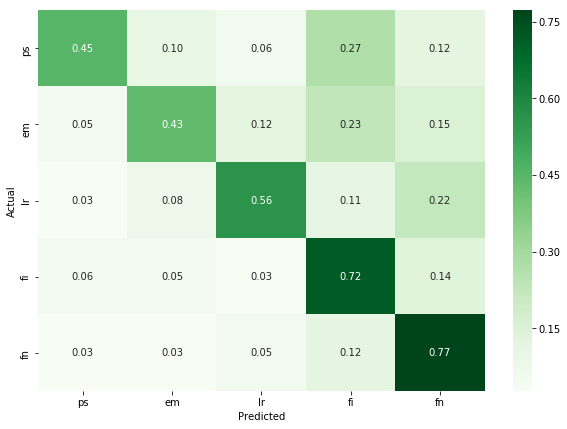

------------- LinearSVC ----------------------------------------
              precision    recall  f1-score   support

          ps       0.86      0.90      0.88       970
          em       0.72      0.65      0.68       949
          lr       0.82      0.81      0.81       944
          fi       0.78      0.78      0.78       948
          fn       0.84      0.89      0.87       927

    accuracy                           0.81      4738
   macro avg       0.80      0.81      0.80      4738
weighted avg       0.80      0.81      0.80      4738



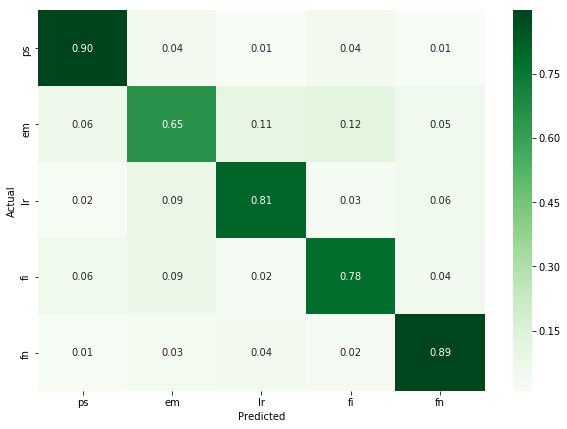

------------- MultinomialNB ----------------------------------------
              precision    recall  f1-score   support

          ps       0.99      0.55      0.71       970
          em       0.57      0.70      0.63       949
          lr       0.85      0.71      0.78       944
          fi       0.58      0.87      0.70       948
          fn       0.89      0.79      0.84       927

    accuracy                           0.72      4738
   macro avg       0.78      0.73      0.73      4738
weighted avg       0.78      0.72      0.73      4738



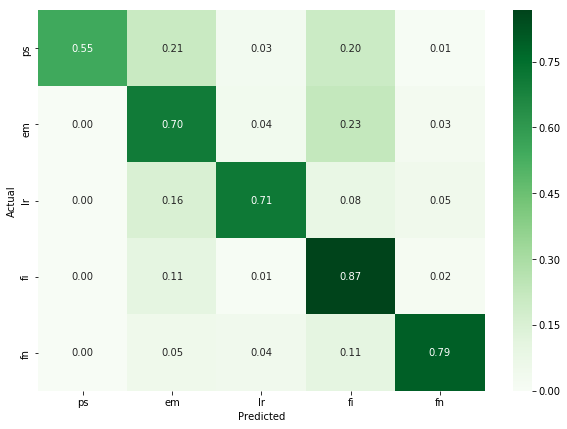

C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

------------- LogisticRegression ----------------------------------------
              precision    recall  f1-score   support

          ps       0.85      0.87      0.86       970
          em       0.76      0.61      0.68       949
          lr       0.83      0.78      0.81       944
          fi       0.72      0.83      0.77       948
          fn       0.81      0.87      0.84       927

    accuracy                           0.79      4738
   macro avg       0.80      0.79      0.79      4738
weighted avg       0.80      0.79      0.79      4738



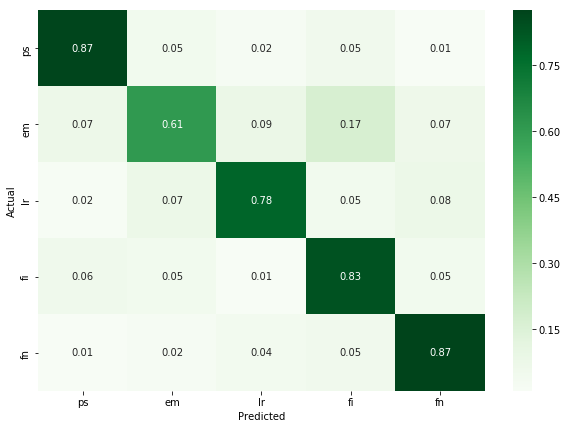

------------- DecisionTreeClassifier ----------------------------------------
              precision    recall  f1-score   support

          ps       0.25      0.96      0.40       970
          em       0.87      0.17      0.29       949
          lr       0.65      0.24      0.35       944
          fi       0.80      0.16      0.26       948
          fn       0.71      0.24      0.36       927

    accuracy                           0.36      4738
   macro avg       0.66      0.35      0.33      4738
weighted avg       0.65      0.36      0.33      4738



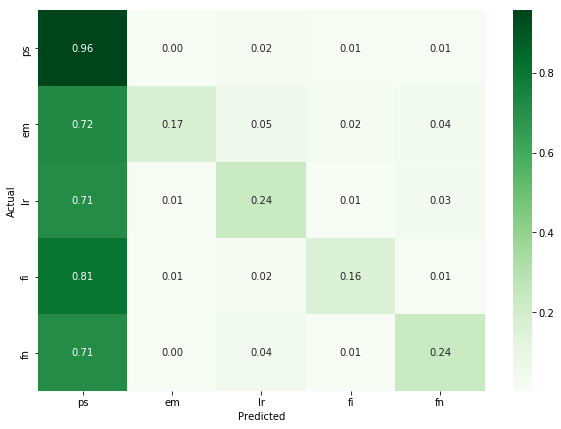

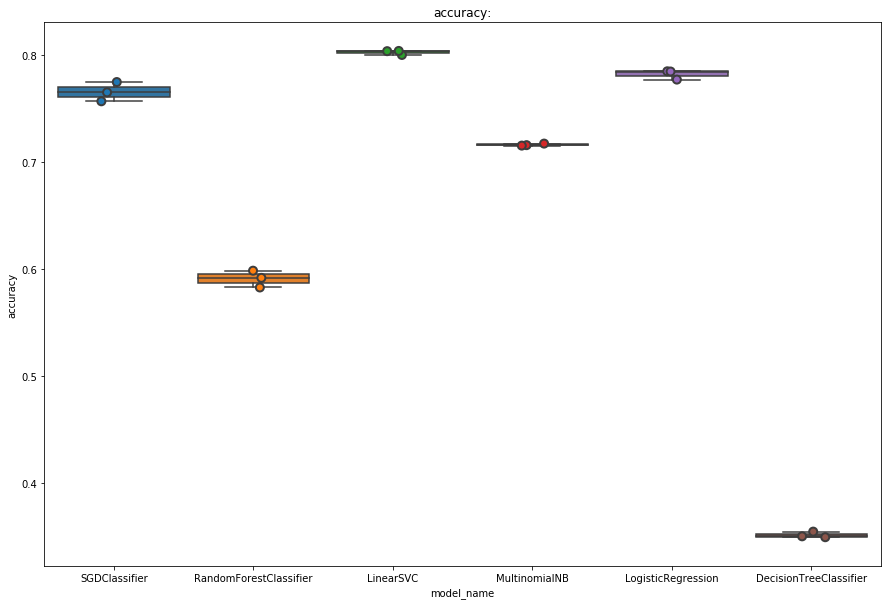

Accuracy:
model_name
DecisionTreeClassifier    0.351654
LinearSVC                 0.802438
LogisticRegression        0.782097
MultinomialNB             0.716127
RandomForestClassifier    0.591083
SGDClassifier             0.765517
Name: accuracy, dtype: float64


True

In [20]:
NLP_plots_models.multi_models_test(features, labels, CV=3)

## Parlementaires :

### Description des données :

In [3]:
print('tous les partis de la base : ', df_tweets_parlementaires.party.unique())

tous les partis de la base :  ['SOC' 'LR' 'LaREM']


In [4]:
partis=['SOC', 'LR', 'LaREM']
df_tweets_parlementaires = df_tweets_parlementaires[df_tweets_parlementaires.party.isin(partis)]
print("Les partis considérés : ", df_tweets_parlementaires.party.unique())

Les partis considérés :  ['SOC' 'LR' 'LaREM']


### Preprocessing :

In [5]:
df_tweets_parlementaires['tweets'] = df_tweets_parlementaires['tweets'].astype('str').apply(NLP_plots_models.clean_text_lemma)

KeyboardInterrupt: 

On enregistre le preprocessing:

In [49]:
df_tweets_parlementaires.to_csv('Donnees_clean/Models/Parlementaires_Lemma_partis.csv', index=False)

### TFIDF :

In [24]:
# Initializing TFIDF :
tfidf = TfidfVectorizer(sublinear_tf=True, min_df=5, norm='l2', encoding='latin-1', ngram_range=(1, 2))
#Attributs :
features = tfidf.fit_transform(df_tweets_parlementaires.tweets)
#Labels :
labels = df_tweets_parlementaires.party

### Pie chart des partis :

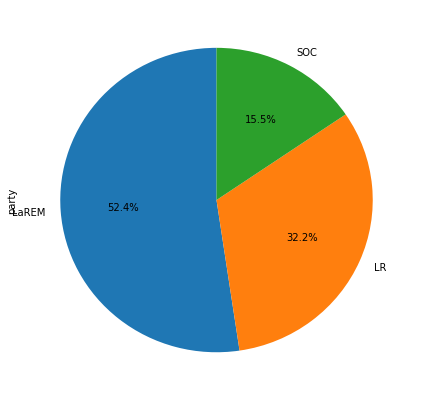

True

In [25]:
NLP_plots_models.partis_pie_chart(labels)

### Correlations :

In [8]:
NLP_plots_models.correlations_uni_bi_grams(features, labels, tfidf, N=5)

For the party : 'SOC':
  . Most correlated unigrams:
. gers
. flat
. orchies
. socialiste
. directsenat
  . Most correlated bigrams:
. matin suite
. france laurent
. socialiste ai
. groupe socialiste
. droite senatoriale
For the party : 'LR':
  . Most correlated unigrams:
. larepubliqueenmarche
. fillonpresident
. lesrepublicains
. senat
. larcher
  . Most correlated bigrams:
. christian jacob
. nicolas sarkozy
. francois fillon
. famille politique
. droite centre
For the party : 'LaREM':
  . Most correlated unigrams:
. larcher
. directsenat
. enmarche
. larepubliqueenmarche
. senat
  . Most correlated bigrams:
. nationale fr
. droite centre
. famille politique
. lrem circo
. circo lrem


True

### Application des modèles :

------------- SGDClassifier ----------------------------------------
              precision    recall  f1-score   support

         SOC       1.00      0.10      0.18        30
          LR       0.80      0.76      0.78        63
       LaREM       0.74      0.95      0.83       104

    accuracy                           0.76       197
   macro avg       0.85      0.60      0.60       197
weighted avg       0.80      0.76      0.72       197



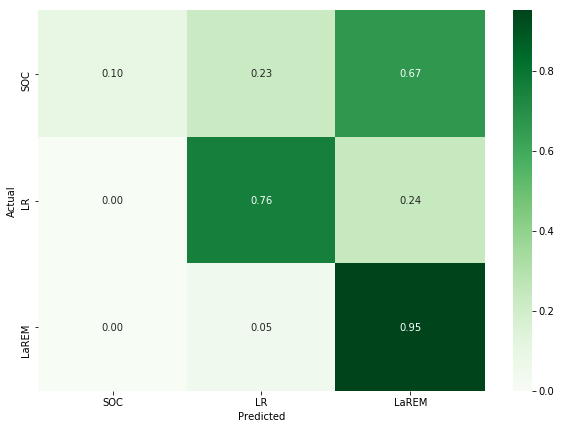

------------- RandomForestClassifier ----------------------------------------


C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

         SOC       0.00      0.00      0.00        30
          LR       0.88      0.11      0.20        63
       LaREM       0.54      0.99      0.70       104

    accuracy                           0.56       197
   macro avg       0.47      0.37      0.30       197
weighted avg       0.57      0.56      0.43       197



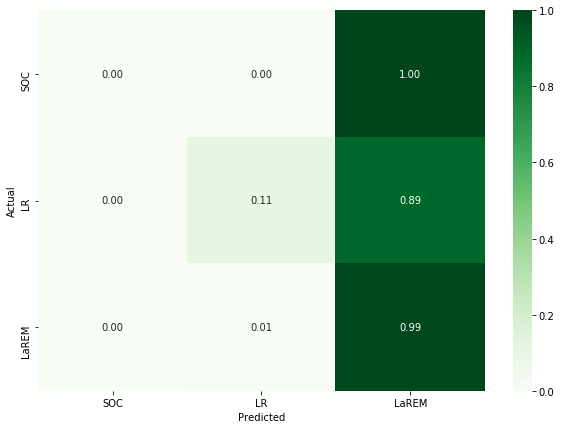

------------- LinearSVC ----------------------------------------
              precision    recall  f1-score   support

         SOC       1.00      0.07      0.12        30
          LR       0.79      0.73      0.76        63
       LaREM       0.72      0.95      0.82       104

    accuracy                           0.75       197
   macro avg       0.84      0.58      0.57       197
weighted avg       0.79      0.75      0.70       197



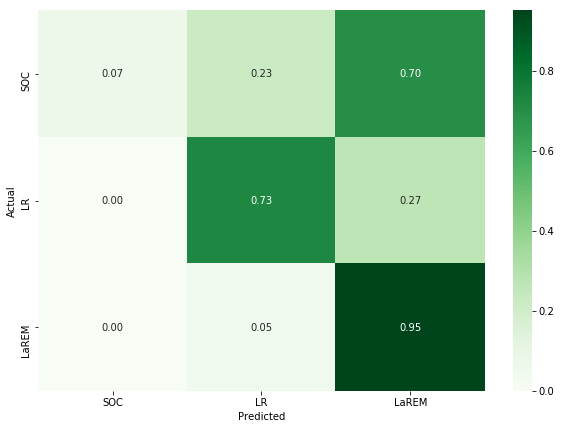

------------- MultinomialNB ----------------------------------------


C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

         SOC       0.00      0.00      0.00        30
          LR       0.00      0.00      0.00        63
       LaREM       0.53      1.00      0.69       104

    accuracy                           0.53       197
   macro avg       0.18      0.33      0.23       197
weighted avg       0.28      0.53      0.36       197



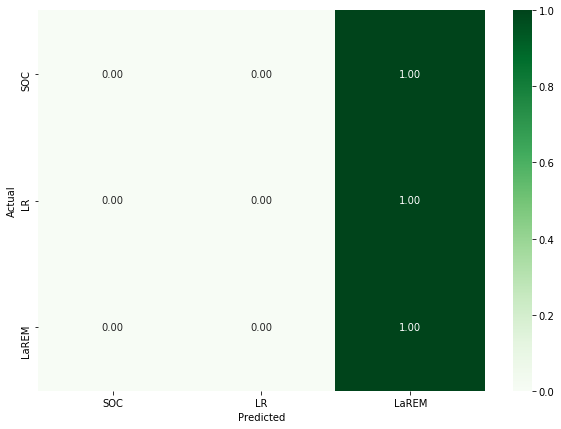

C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


------------- LogisticRegression ----------------------------------------


C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

         SOC       0.00      0.00      0.00        30
          LR       0.86      0.30      0.45        63
       LaREM       0.59      0.99      0.74       104

    accuracy                           0.62       197
   macro avg       0.48      0.43      0.40       197
weighted avg       0.59      0.62      0.53       197



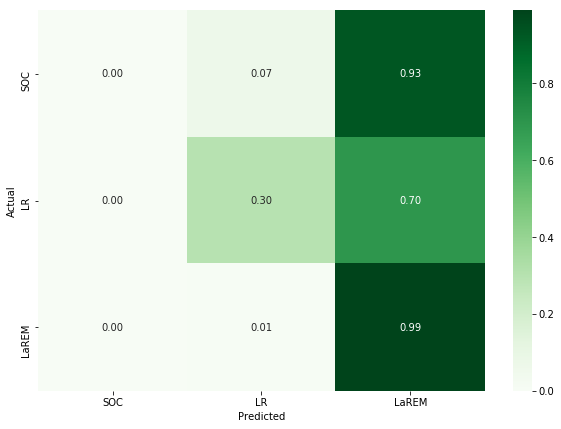

------------- DecisionTreeClassifier ----------------------------------------
              precision    recall  f1-score   support

         SOC       0.20      0.20      0.20        30
          LR       0.51      0.38      0.44        63
       LaREM       0.59      0.68      0.63       104

    accuracy                           0.51       197
   macro avg       0.43      0.42      0.42       197
weighted avg       0.51      0.51      0.50       197



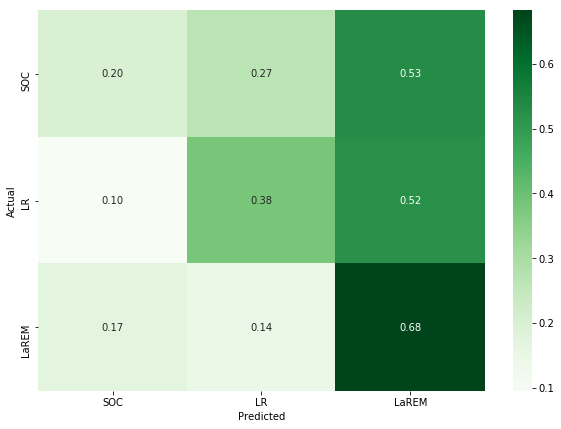

------------- AdaBoostClassifier ----------------------------------------
              precision    recall  f1-score   support

         SOC       0.47      0.23      0.31        30
          LR       0.51      0.67      0.58        63
       LaREM       0.75      0.72      0.74       104

    accuracy                           0.63       197
   macro avg       0.58      0.54      0.54       197
weighted avg       0.63      0.63      0.62       197



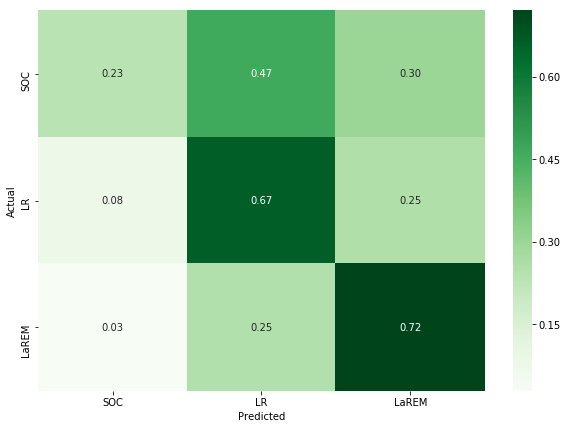

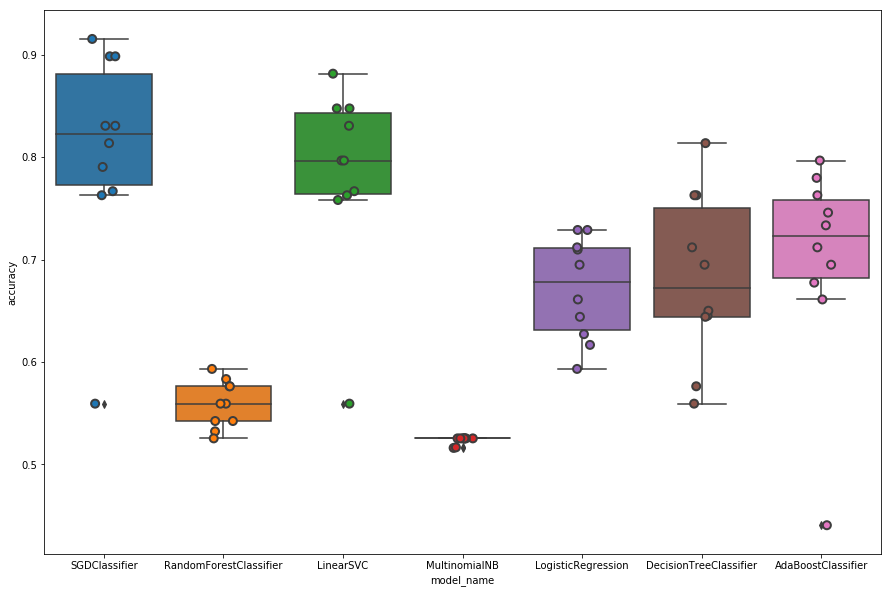

model_name
AdaBoostClassifier        0.700397
DecisionTreeClassifier    0.682059
LinearSVC                 0.784677
LogisticRegression        0.671617
MultinomialNB             0.523619
RandomForestClassifier    0.559017
SGDClassifier             0.806546
Name: accuracy, dtype: float64


True

In [9]:
NLP_plots_models.multi_models_test(features, labels, CV=10)

### Over-sampling:

In [9]:
# separate minority and majority classes
LaREM = df_tweets_parlementaires[df_tweets_parlementaires.party=='LaREM']
LR = df_tweets_parlementaires[df_tweets_parlementaires.party=='LR']
SOC = df_tweets_parlementaires[df_tweets_parlementaires.party=='SOC']

# upsample minority 'LR'
LR_upsampled = resample(LR,
                          replace=True, # sample with replacement
                          n_samples=len(LaREM), # match number in majority class
                          random_state=27) # reproducible results
# upsample minority 'SOC'
SOC_upsampled = resample(SOC,
                          replace=True, # sample with replacement
                          n_samples=len(LaREM), # match number in majority class
                          random_state=27) # reproducible results


In [10]:
# combine majority and upsampled minority
upsampled_partis_parlementaires = pd.concat([LaREM, LR_upsampled, SOC_upsampled])
# On Shuffle le dataset:
upsampled_partis_parlementaires = shuffle(upsampled_partis_parlementaires)

In [11]:
print('Nombre d\'individus dans la base upsmapled:',upsampled_partis_parlementaires.shape[0])

print("Nombre de Ps dans le set upsampled ", upsampled_partis_parlementaires[upsampled_partis_parlementaires.party=='SOC'].shape[0])
print("Nombre de Em dans le set upsampled ", upsampled_partis_parlementaires[upsampled_partis_parlementaires.party=='LaREM'].shape[0])
print("Nombre de Lr dans le set upsampled ", upsampled_partis_parlementaires[upsampled_partis_parlementaires.party=='LR'].shape[0])

Nombre d'individus dans la base upsmapled: 933
Nombre de Ps dans le set upsampled  311
Nombre de Em dans le set upsampled  311
Nombre de Lr dans le set upsampled  311


On a maintenant un set intitulé `upsampled` contenant le même nombre de chaque parti.

In [55]:
# Initializing TFIDF :
tfidf = TfidfVectorizer(sublinear_tf=True, min_df=5, norm='l2', encoding='latin-1', ngram_range=(1, 2))
#Attributs :
features = tfidf.fit_transform(upsampled_partis_parlementaires.tweets).toarray()
#Labels :
labels = upsampled_partis_parlementaires.party

Vérification via Pie Chart :

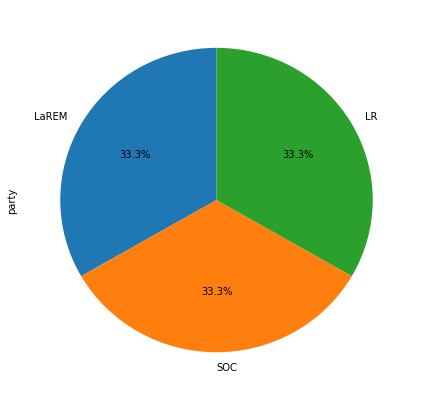

True

In [56]:
NLP_plots_models.partis_pie_chart(labels)

------------- SGDClassifier ----------------------------------------
              precision    recall  f1-score   support

       LaREM       0.94      0.89      0.91       101
          LR       0.95      0.94      0.95       104
         SOC       0.93      0.98      0.95       103

    accuracy                           0.94       308
   macro avg       0.94      0.94      0.94       308
weighted avg       0.94      0.94      0.94       308



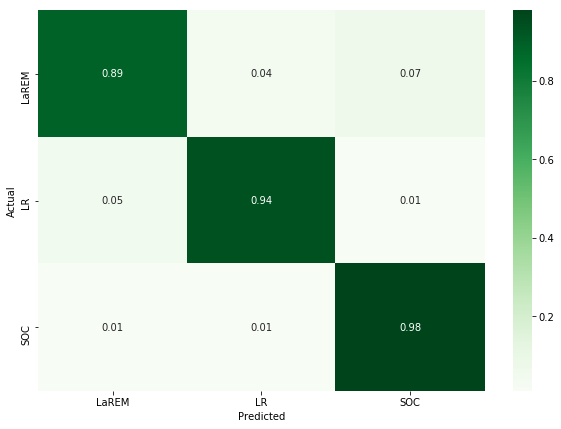

------------- RandomForestClassifier ----------------------------------------
              precision    recall  f1-score   support

       LaREM       0.70      0.85      0.77       101
          LR       0.98      0.60      0.74       104
         SOC       0.72      0.85      0.78       103

    accuracy                           0.77       308
   macro avg       0.80      0.77      0.76       308
weighted avg       0.80      0.77      0.76       308



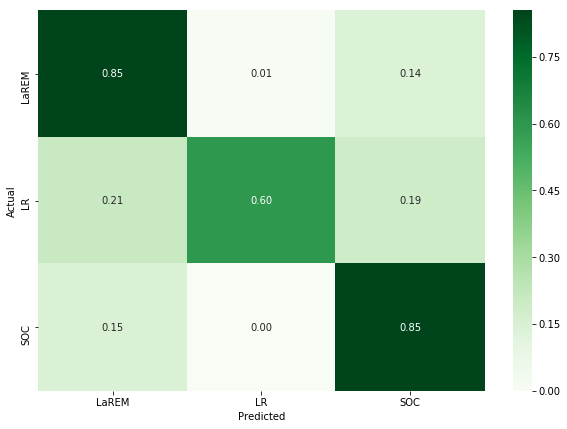

------------- LinearSVC ----------------------------------------
              precision    recall  f1-score   support

       LaREM       0.93      0.92      0.93       101
          LR       0.98      0.95      0.97       104
         SOC       0.94      0.98      0.96       103

    accuracy                           0.95       308
   macro avg       0.95      0.95      0.95       308
weighted avg       0.95      0.95      0.95       308



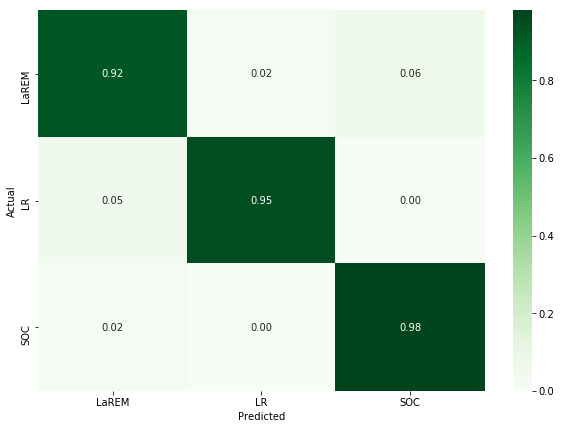

------------- MultinomialNB ----------------------------------------
              precision    recall  f1-score   support

       LaREM       0.57      1.00      0.72       101
          LR       0.99      0.73      0.84       104
         SOC       1.00      0.51      0.68       103

    accuracy                           0.75       308
   macro avg       0.85      0.75      0.75       308
weighted avg       0.85      0.75      0.75       308



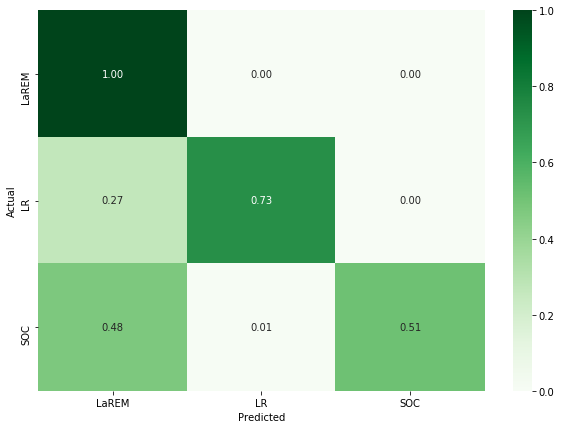

C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default so

------------- LogisticRegression ----------------------------------------
              precision    recall  f1-score   support

       LaREM       0.93      0.91      0.92       101
          LR       0.96      0.92      0.94       104
         SOC       0.93      0.98      0.95       103

    accuracy                           0.94       308
   macro avg       0.94      0.94      0.94       308
weighted avg       0.94      0.94      0.94       308



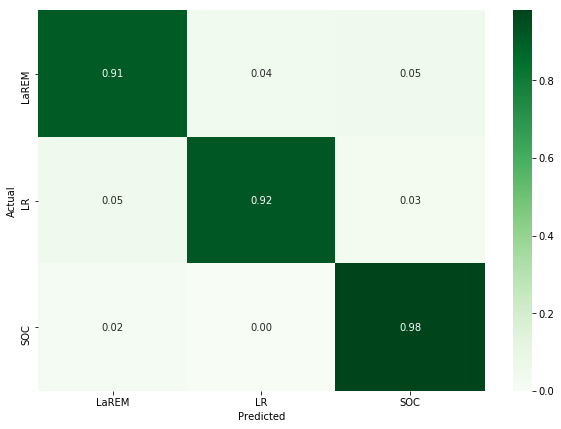

------------- DecisionTreeClassifier ----------------------------------------
              precision    recall  f1-score   support

       LaREM       0.74      0.66      0.70       101
          LR       0.65      0.63      0.64       104
         SOC       0.69      0.77      0.72       103

    accuracy                           0.69       308
   macro avg       0.69      0.69      0.69       308
weighted avg       0.69      0.69      0.69       308



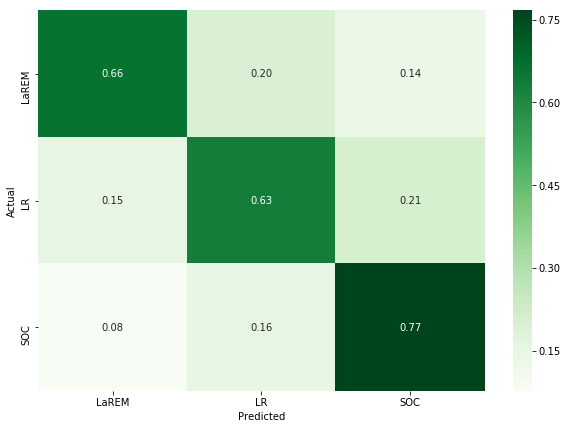

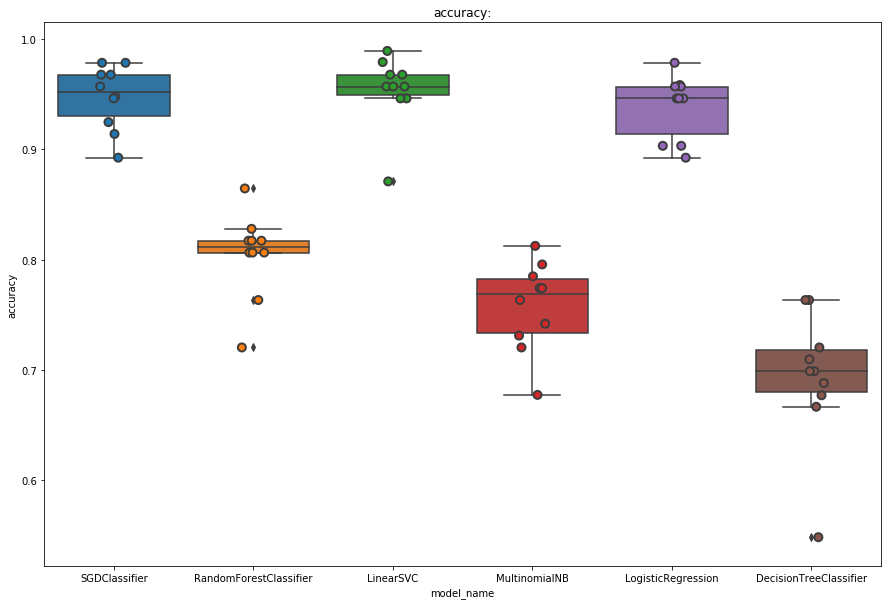

Accuracy:
model_name
DecisionTreeClassifier    0.693515
LinearSVC                 0.953831
LogisticRegression        0.938844
MultinomialNB             0.757594
RandomForestClassifier    0.804738
SGDClassifier             0.947480
Name: accuracy, dtype: float64


True

In [33]:
NLP_plots_models.multi_models_test(features, labels, CV=10)

## Applications :

### Import des contributions :

Une ligne pour chaque contributeur 

Deux colonnes: 

- une pour l'id d'auteur
- une pour tout le texte écrit par l'auteur

In [8]:
df_author_contrib=pd.read_csv('Donnees_clean/contributions_auteur_unique/data_contrib_auteur_unique.csv')

#### Preprocessing :

In [125]:
df_author_contrib['texte'] = df_author_contrib['texte'].astype('str').apply(NLP_plots_models.clean_text_lemma)

Etant donné le temps très long que prend le preprocessing avec lemmatisation, on enregistre ces resultats:

In [128]:
#df_author_contrib.to_csv('Donnees_clean/Models/contributions_preprocessed.csv', index=False)

In [12]:
df_author_contrib=pd.read_csv('Donnees_clean/Models/contributions_lemma_preprocessed.csv')

In [13]:
df_author_contrib.dropna(inplace=True)

### Sur la base des parlementaires : 

On met une colonne 'train' pour savoir si la ligne fait partie de l'entrainement ou du test (1 entrainement, 0 test)

On utilise, étant donné les résultats de classification, la base de données 'sur-échantillonnée'

In [14]:
df_author_contrib['train']=0
upsampled_partis_parlementaires['train']=1

Concaténation des training et test sets pour pouvoir appliquer TF-IDF : 

In [15]:
#Pour simplifier, comme on ne connait pas le parti des contributeurs on leur attribut la valeur 0
df_author_contrib['party']=0

In [16]:
# création des données : d'abord les contributions puis la base de données d'apprentissage
d={"texte" : pd.concat([df_author_contrib.texte, upsampled_partis_parlementaires.tweets], axis=0), 
   
   "party" : pd.concat([df_author_contrib.party,upsampled_partis_parlementaires.party], axis=0),
   
   "train" : pd.concat([df_author_contrib.train, upsampled_partis_parlementaires.train], axis=0) 
}
df_all=pd.DataFrame(data=d)

#### TFIDF :

In [17]:
# Initializing TFIDF :
tfidf = TfidfVectorizer(sublinear_tf=True, min_df=5, norm='l2', encoding='latin-1', ngram_range=(1, 2), dtype='float32')
#Attributs :
tfidf.fit(df_all.texte)

C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:1616: UserWarning: Only (<class 'numpy.float64'>, <class 'numpy.float32'>, <class 'numpy.float16'>) 'dtype' should be used. float32 'dtype' will be converted to np.float64.
  UserWarning)


TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype='float32', encoding='latin-1', input='content',
                lowercase=True, max_df=1.0, max_features=None, min_df=5,
                ngram_range=(1, 2), norm='l2', preprocessor=None,
                smooth_idf=True, stop_words=None, strip_accents=None,
                sublinear_tf=True, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, use_idf=True, vocabulary=None)

In [18]:
features_contrib = tfidf.transform(df_all.texte)

#### Entrainement du modèle :

On divise entre training/test sets :

In [19]:
features_contrib_train= features_contrib[-upsampled_partis_parlementaires.shape[0]:,:]
features_contrib_test= features_contrib[:df_author_contrib.shape[0]:,:]

In [20]:
labels=upsampled_partis_parlementaires.party

#### Avec LinearSVC:

In [21]:
#initialisation du modèle :
model=LinearSVC()

In [22]:
#On fit le modèle :
model.fit(features_contrib_train, labels)

LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=1000,
          multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
          verbose=0)

##### Application du modèle :

In [23]:
label_pred = model.predict(features_contrib_test)

##### Résultats :

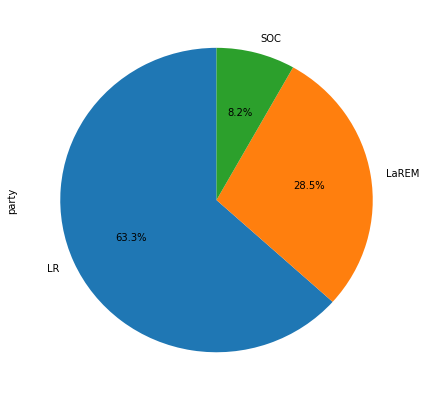

In [24]:
#Pour pouvoir utiliser la fonction, on le convertit en dataframe
d={'party' : label_pred}
label_pred=pd.DataFrame(data=d)

#On affiche le pie chart :
NLP_plots_models.partis_pie_chart(label_pred.party)

On enregistre les résultats de classification:

In [28]:
#label_pred.to_csv('Donnees_clean/Classifications/predictions_partis_Parlementaires_LinearSVC.csv', index=False)

Wordcloud:

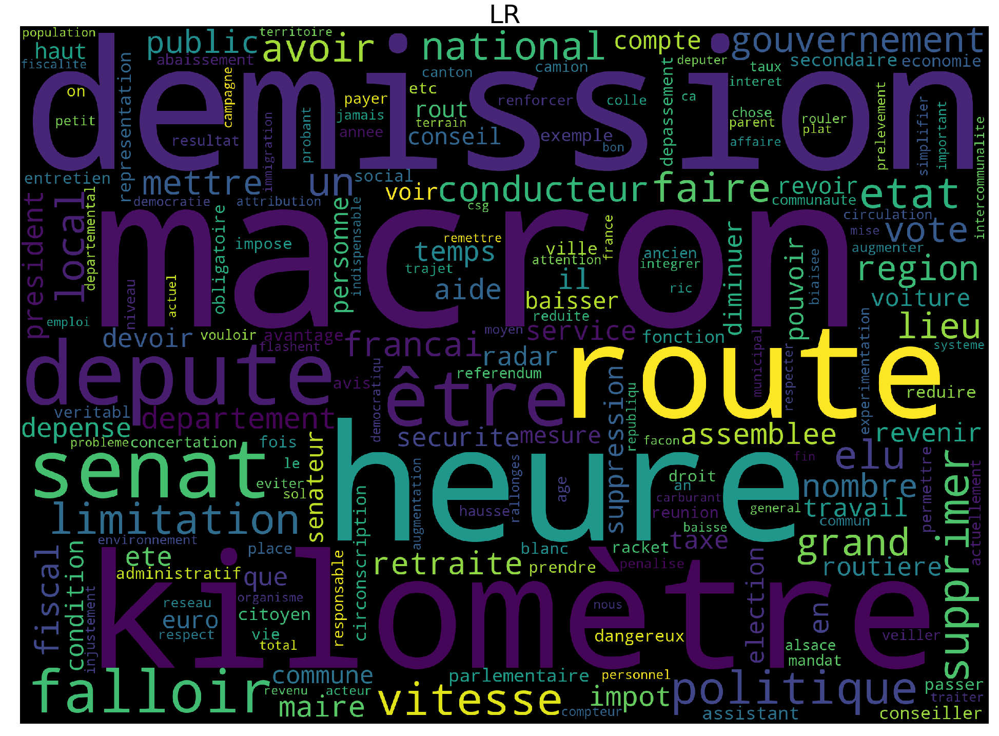

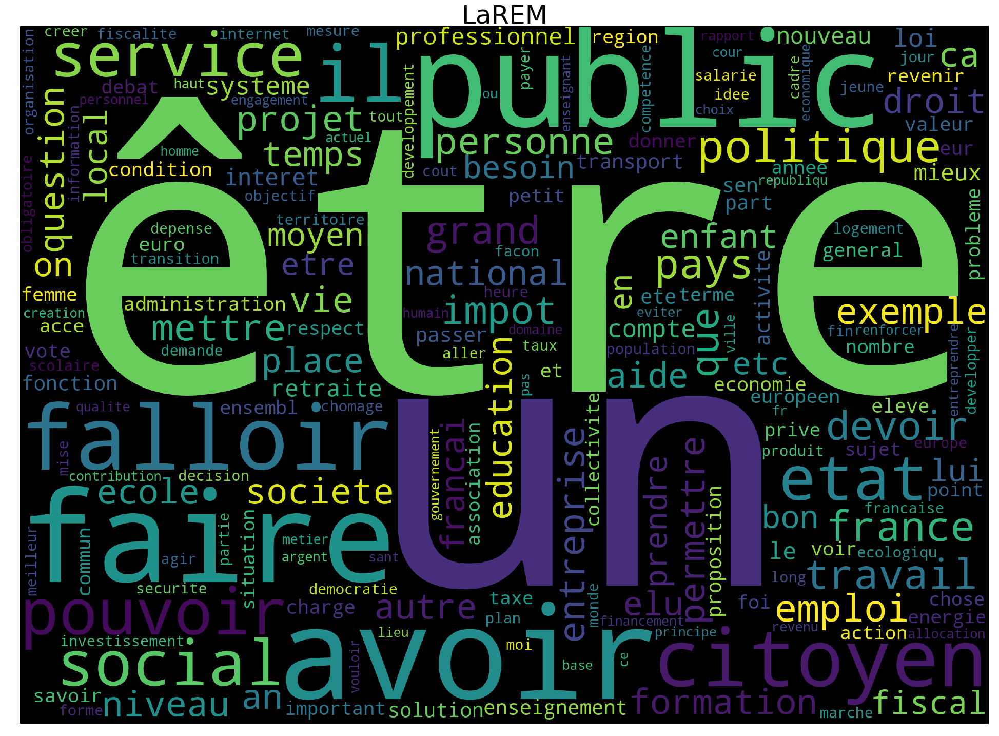

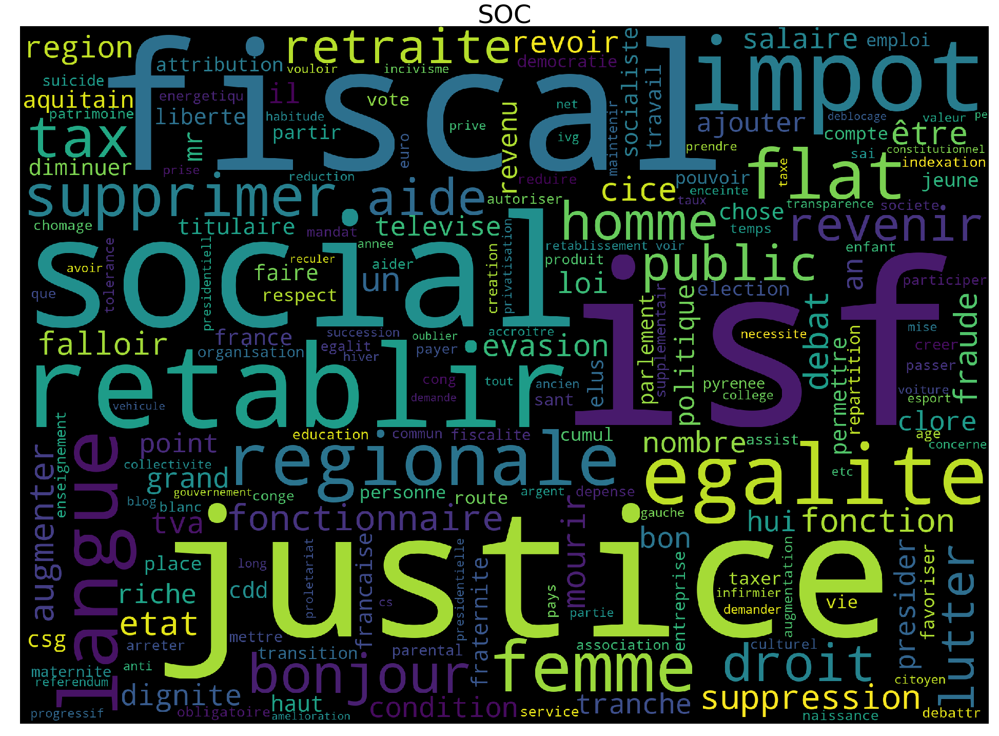

In [27]:
NLP_plots_models.wordcloud_decision(model,features_contrib_test, df_author_contrib)

#### Avec Régression Logistique:

In [29]:
#initialisation du modèle :
model=LogisticRegression()

In [30]:
#On fit le modèle :
model.fit(features_contrib_train, labels)

C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\adrie\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

##### Application du modèle :

In [31]:
label_pred = model.predict(features_contrib_test)

##### Résultats :

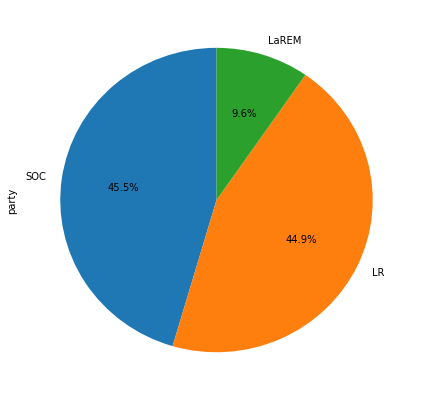

In [32]:
#Pour pouvoir utiliser la fonction, on le convertit en dataframe
d={'party' : label_pred}
label_pred=pd.DataFrame(data=d)

#On affiche le pie chart :
NLP_plots_models.partis_pie_chart(label_pred.party)

On enregsitre les résultats de classification:

In [33]:
#label_pred.to_csv('Donnees_clean/Classifications/predictions_partis_Parlementaires_LogReg.csv', index=False)

Wordcloud:

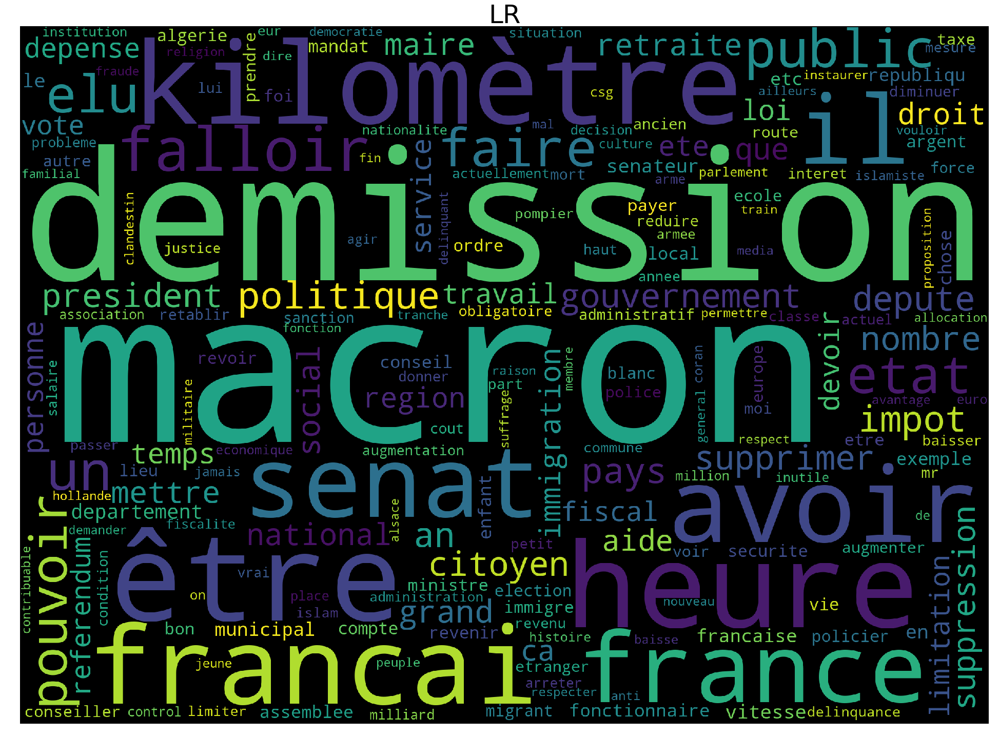

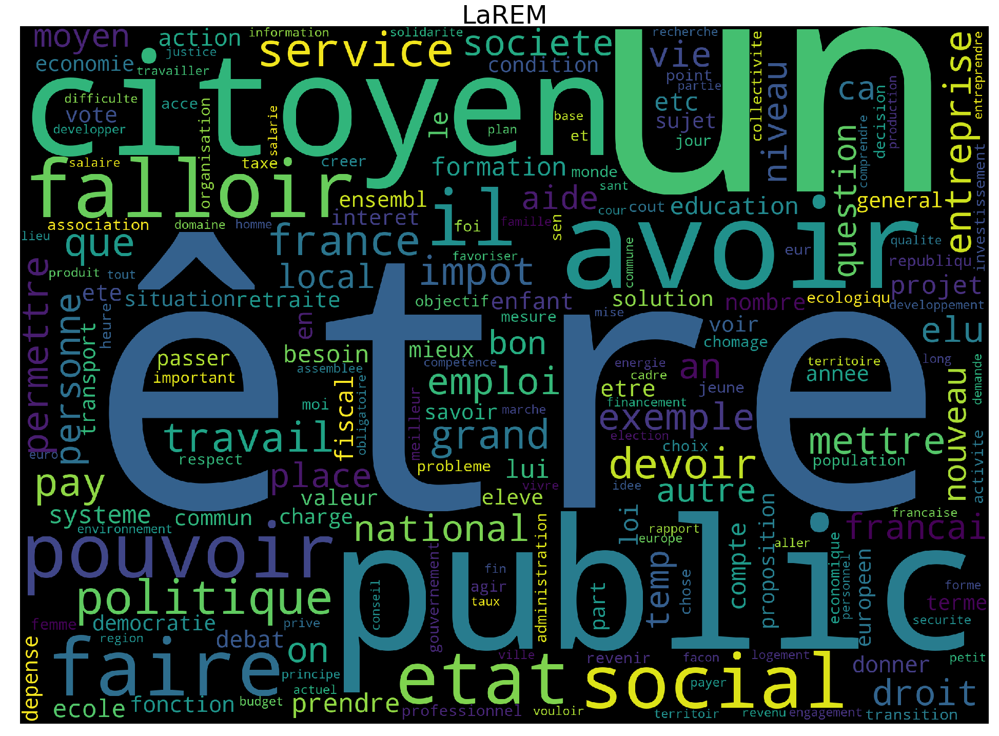

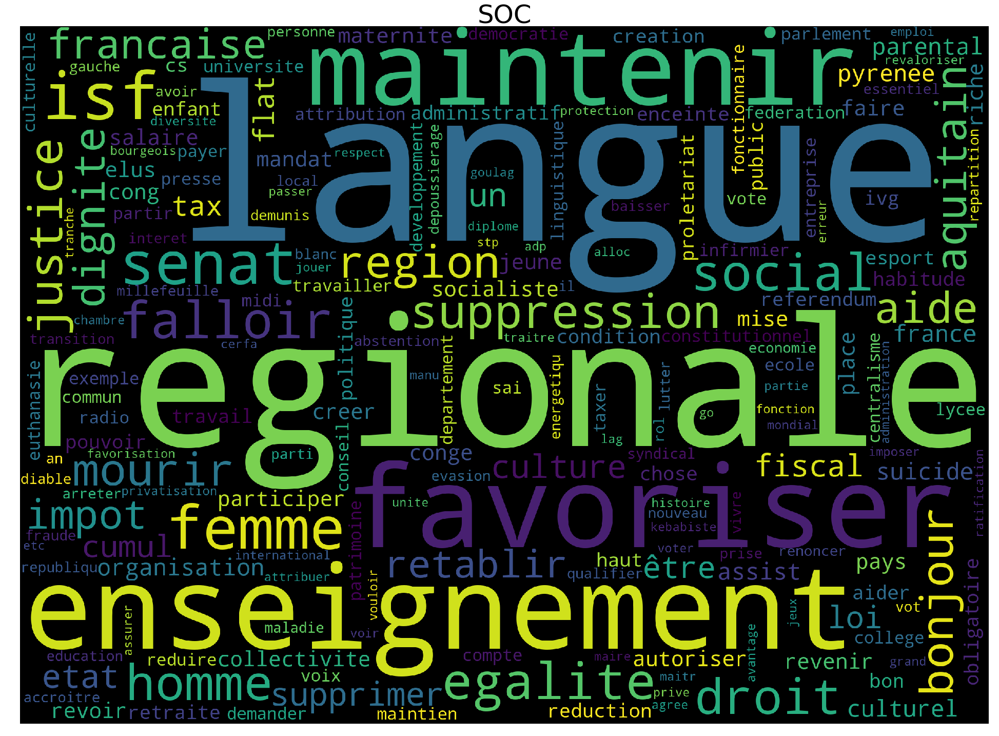

In [36]:
NLP_plots_models.wordcloud_decision(model,features_contrib_test, df_author_contrib)

#### Avec SGD :  

In [37]:
#initialisation du modèle :
model=SGDClassifier()

In [38]:
#On fit le modèle :
model.fit(features_contrib_train, labels)

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)

##### Application du modèle :

In [39]:
label_pred = model.predict(features_contrib_test)

##### Résultats :

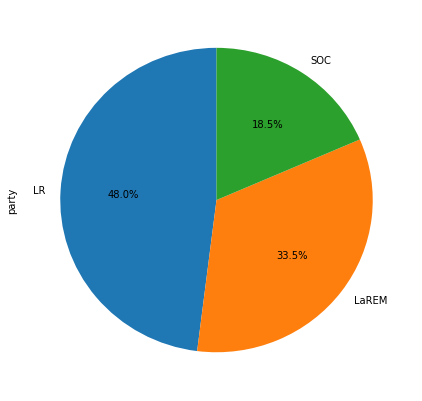

In [40]:
#Pour pouvoir utiliser la fonction, on le convertit en dataframe
d={'party' : label_pred}
label_pred=pd.DataFrame(data=d)

#On affiche le pie chart :
NLP_plots_models.partis_pie_chart(label_pred.party)

On enregistre les résultats de classification:

In [41]:
#label_pred.to_csv('Donnees_clean/Classifications/predictions_partis_Parlementaires_SGD.csv', index=False)

Wordcloud:

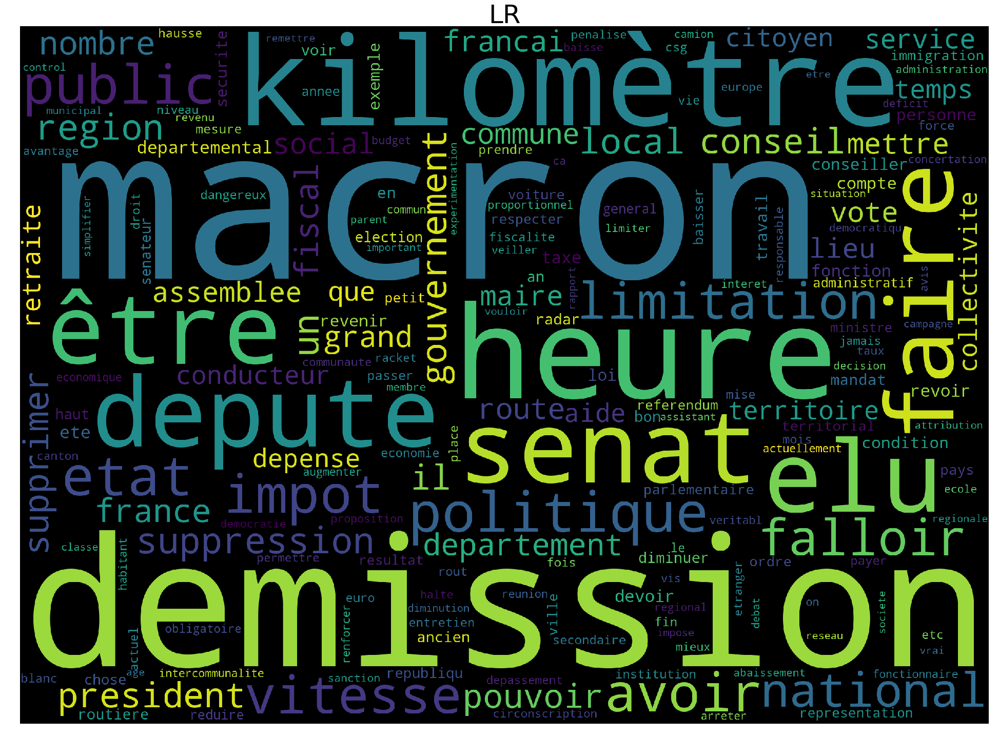

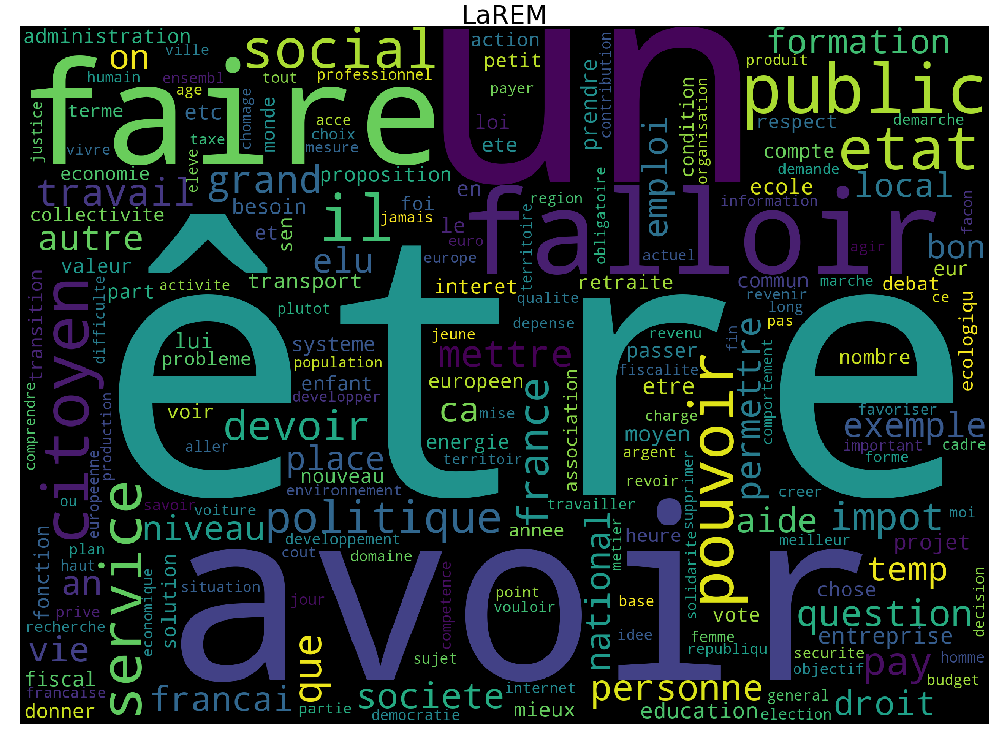

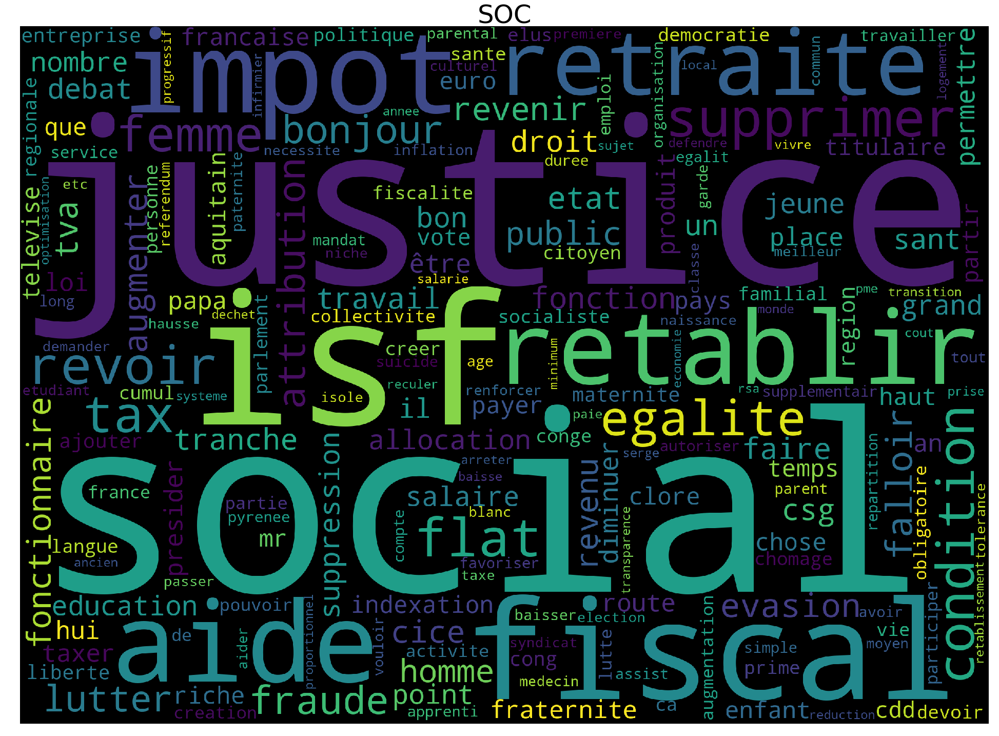

In [42]:
NLP_plots_models.wordcloud_decision(model,features_contrib_test, df_author_contrib)

### Avec la base #Elysée2017

On met une colonne 'train' pour savoir si la ligne fait partie de l'entrainement ou du test (1 entrainement, 0 test)

On utilise, étant donné les résultats de classification, la base de données 'sur-échantillonnée'

In [51]:
df_author_contrib['train']=0
upsampled_partis_elysee['train']=1

Concaténation des training et test sets pour pouvoir appliquer TF-IDF : 

In [52]:
#Pour simplifier, comme on ne connait pas le parti des contributeurs on leur attribut la valeur 0
df_author_contrib['party']=0

In [53]:
# création des données : d'abord les contributions puis la base de données d'apprentissage
d={"texte" : pd.concat([df_author_contrib.texte, upsampled_partis_elysee.tweets], axis=0), 
   
   "party" : pd.concat([df_author_contrib.party,upsampled_partis_elysee.party], axis=0),
   
   "train" : pd.concat([df_author_contrib.train, upsampled_partis_elysee.train], axis=0) 
}
df_all=pd.DataFrame(data=d)

#### TFIDF :

In [54]:
# Initializing TFIDF :
tfidf = TfidfVectorizer(sublinear_tf=True, min_df=5, norm='l2', encoding='latin-1', ngram_range=(1, 2), dtype='float32')
#Attributs :
tfidf.fit(df_all.texte)

TfidfVectorizer(analyzer='word', binary=False, decode_error='strict',
                dtype='float32', encoding='latin-1', input='content',
                lowercase=True, max_df=1.0, max_features=None, min_df=5,
                ngram_range=(1, 2), norm='l2', preprocessor=None,
                smooth_idf=True, stop_words=None, strip_accents=None,
                sublinear_tf=True, token_pattern='(?u)\\b\\w\\w+\\b',
                tokenizer=None, use_idf=True, vocabulary=None)

In [55]:
features_contrib = tfidf.transform(df_all.texte)

#### Entrainement du modèle :

On divise entre training/test sets :

In [56]:
features_contrib_train= features_contrib[-upsampled_partis_elysee.shape[0]:,:]
features_contrib_test= features_contrib[:df_author_contrib.shape[0]:,:]

In [57]:
labels=upsampled_partis_elysee.party

#### Avec LinearSVC:

In [76]:
#initialisation du modèle :
model=LinearSVC()

In [77]:
#On fit le modèle :
model.fit(features_contrib_train, labels)

LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=1000,
          multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
          verbose=0)

##### Application du modèle :

In [78]:
label_pred = model.predict(features_contrib_test)

##### Résultats :

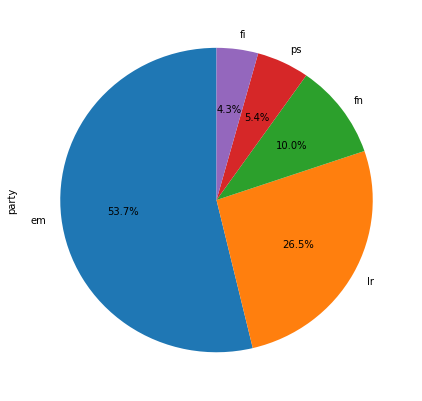

In [79]:
#Pour pouvoir utiliser la fonction, on le convertit en dataframe
d={'party' : label_pred}
label_pred=pd.DataFrame(data=d)

#On affiche le pie chart :
NLP_plots_models.partis_pie_chart(label_pred.party)

On enregistre les résultats de la classification : 

In [80]:
#label_pred.to_csv('Donnees_clean/Classifications/predictions_partis_Elysee_LinearSVC.csv', index=False)

Wordcloud:

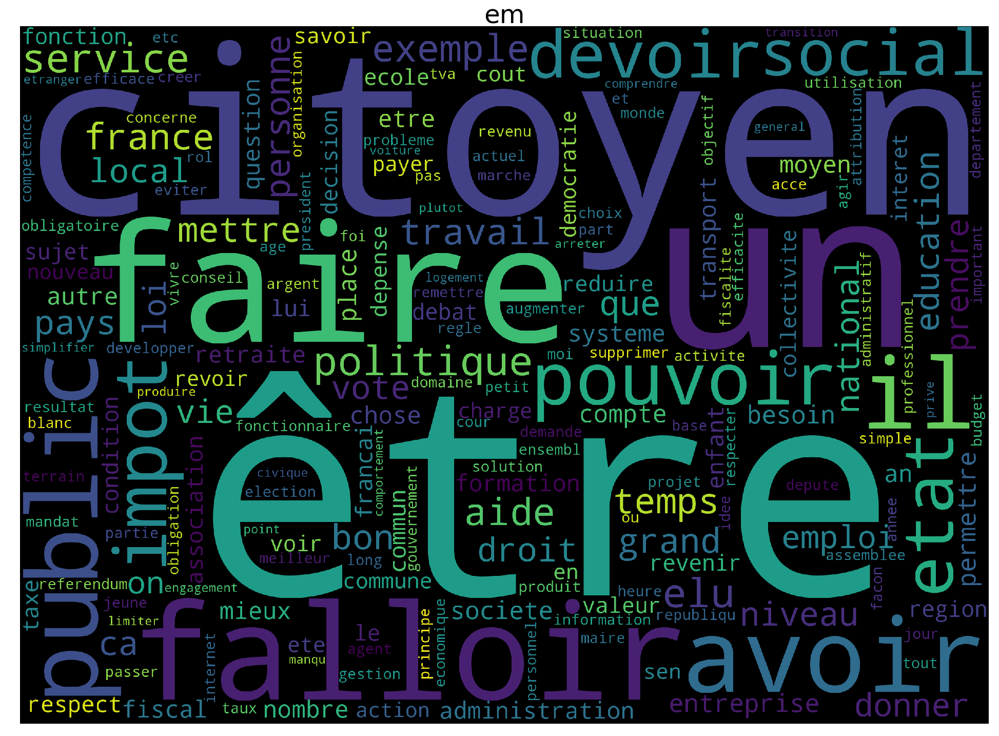

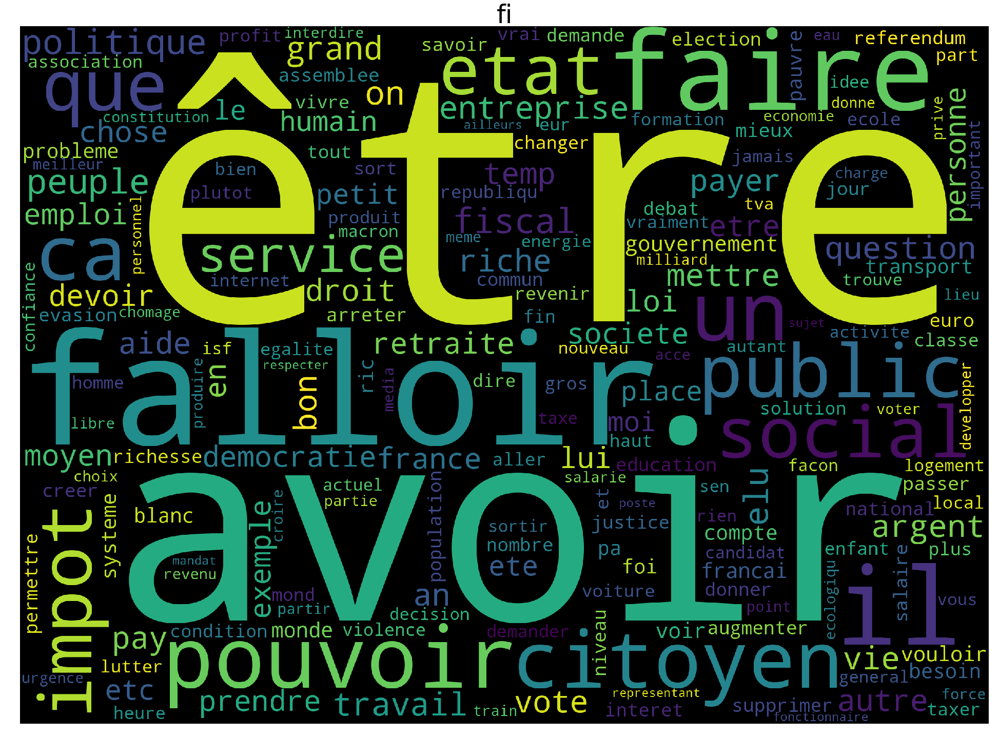

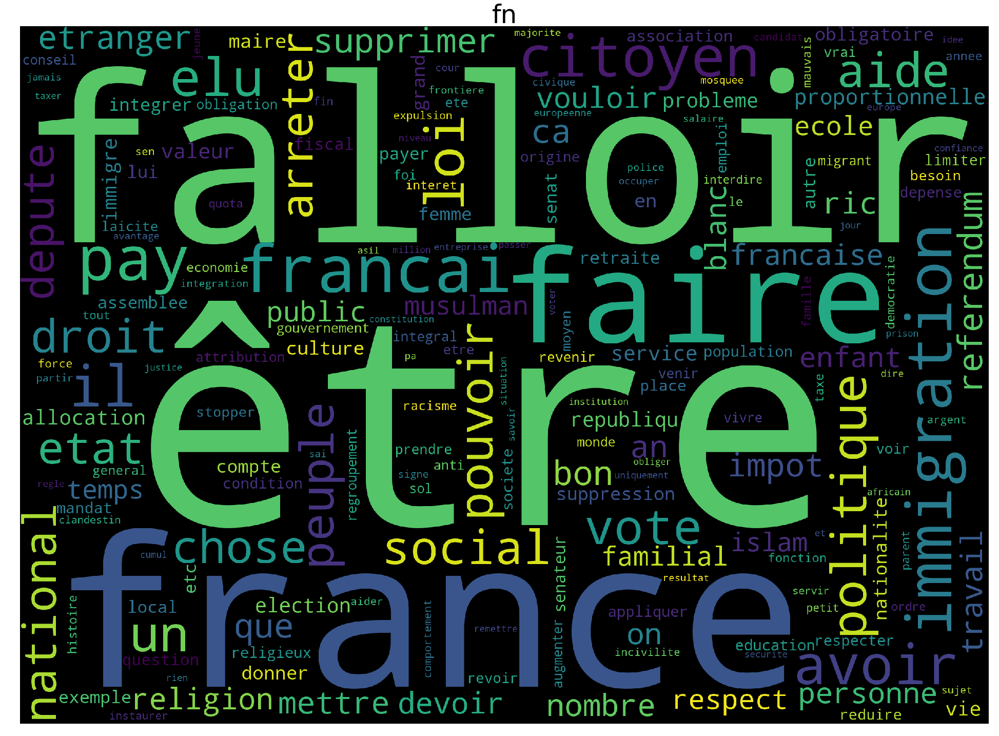

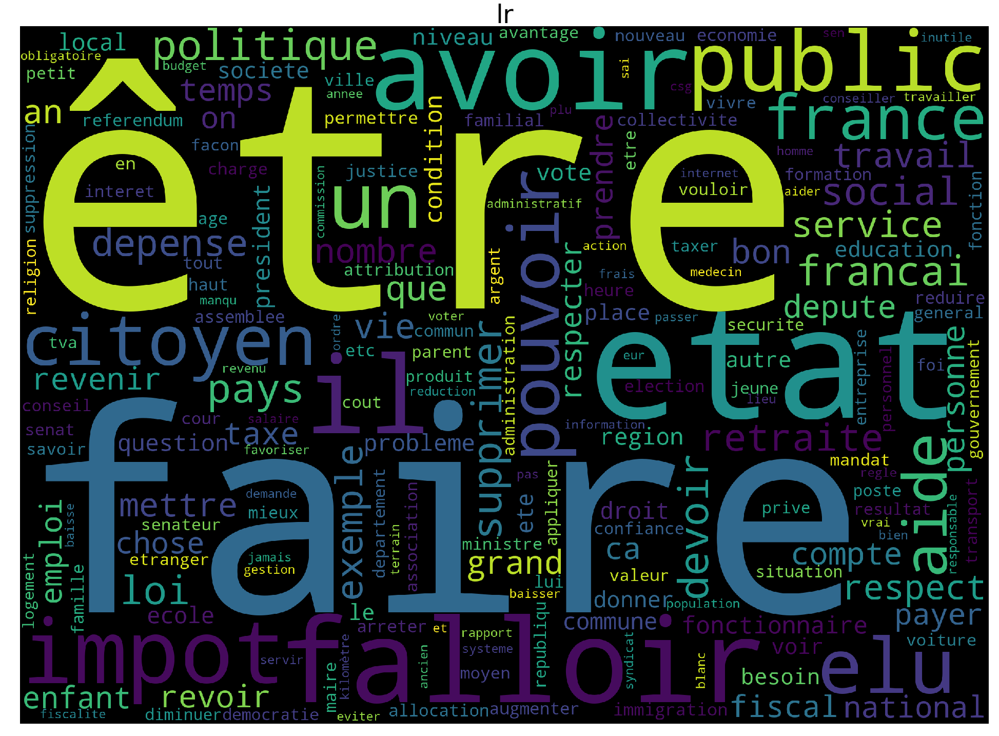

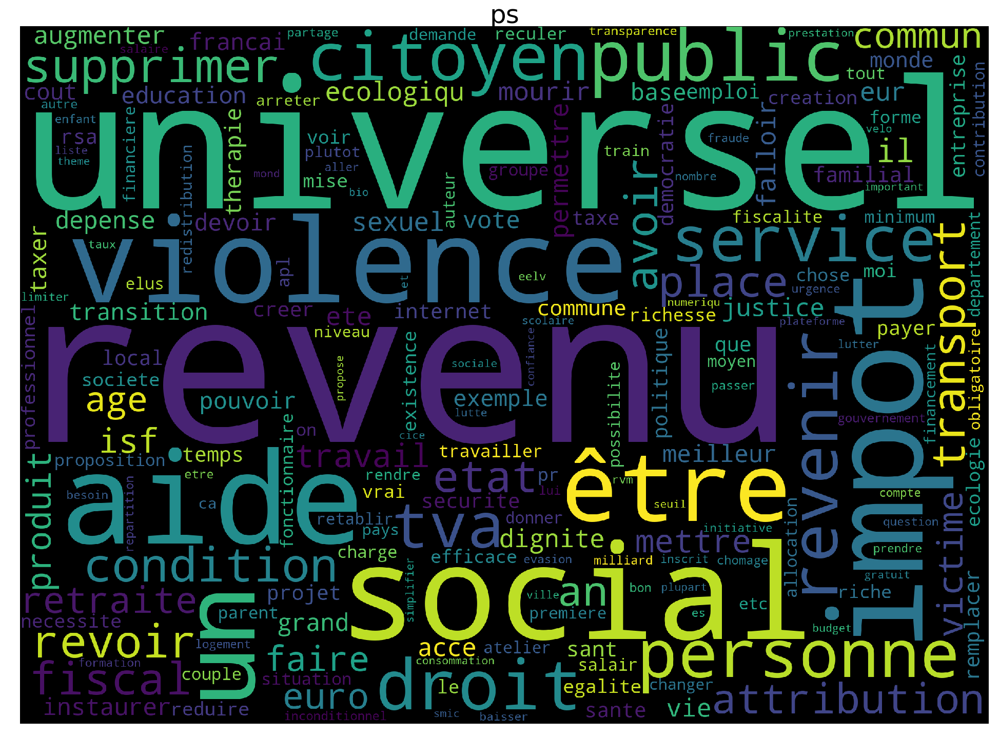

In [63]:
NLP_plots_models.wordcloud_decision(model,features_contrib_test, df_author_contrib)

#### Avec Régression Logistique:

In [81]:
#initialisation du modèle :
model=LogisticRegression()

In [82]:
#On fit le modèle :
model.fit(features_contrib_train, labels)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

##### Application du modèle :

In [83]:
label_pred = model.predict(features_contrib_test)

##### Résultats :

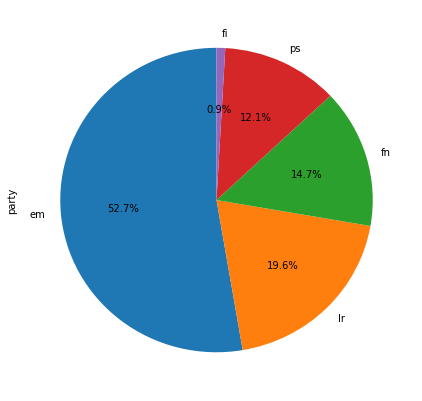

In [84]:
#Pour pouvoir utiliser la fonction, on le convertit en dataframe
d={'party' : label_pred}
label_pred=pd.DataFrame(data=d)

#On affiche le pie chart :
NLP_plots_models.partis_pie_chart(label_pred.party)

On enregistre les résultats de la classification :

In [85]:
#label_pred.to_csv('Donnees_clean/Classifications/predictions_partis_Elysee_LogReg.csv', index=False)

Wordcloud:

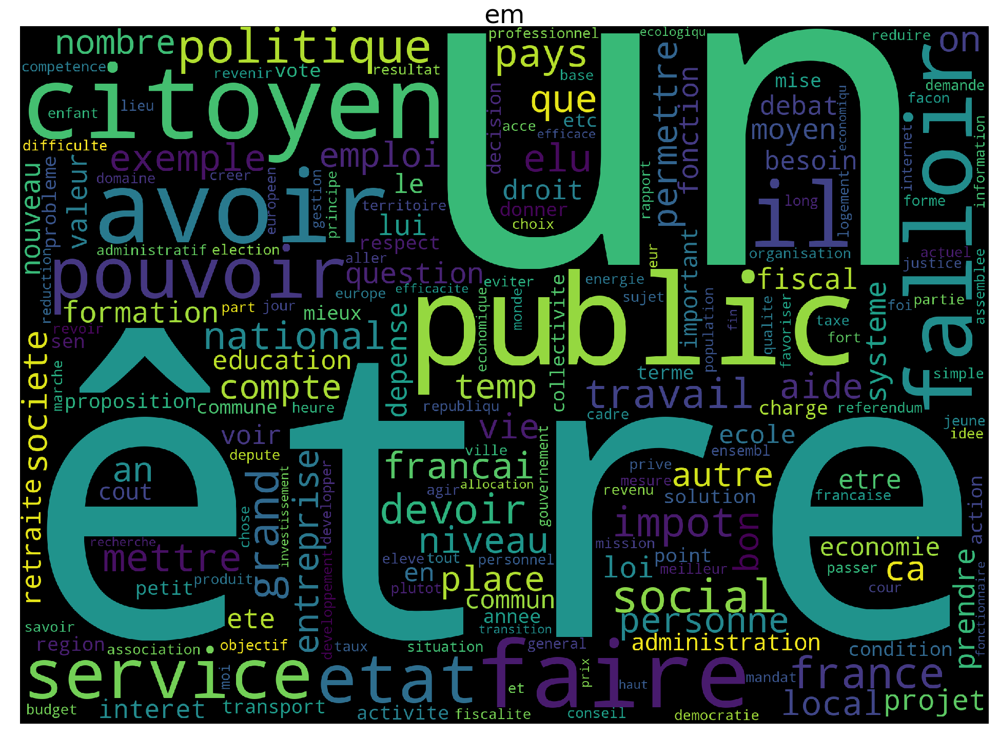

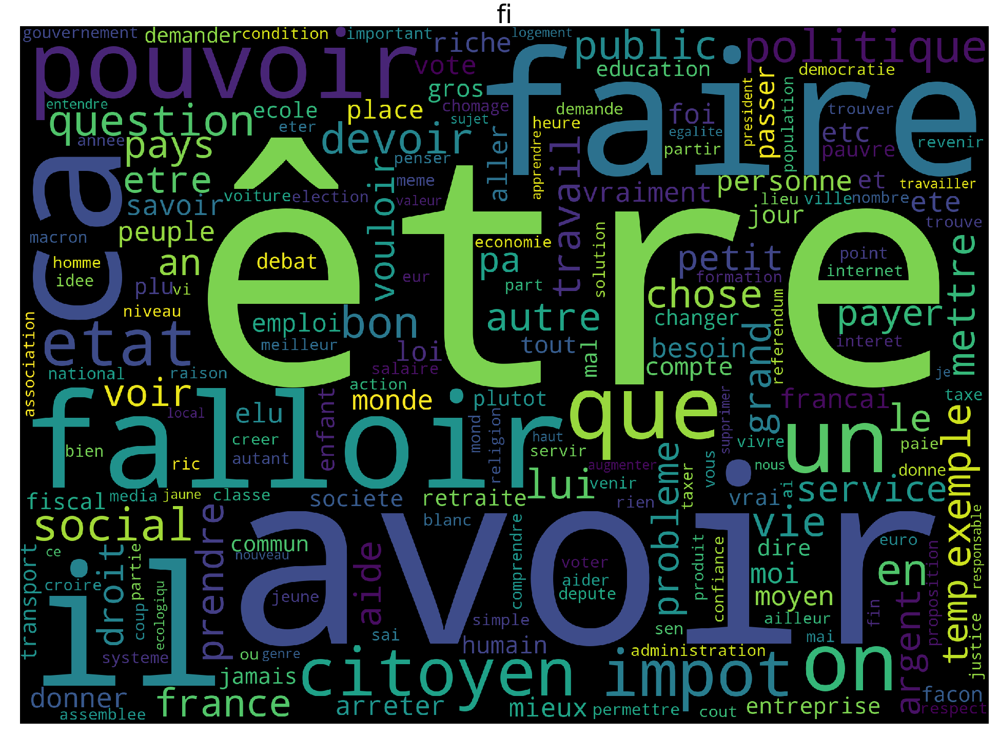

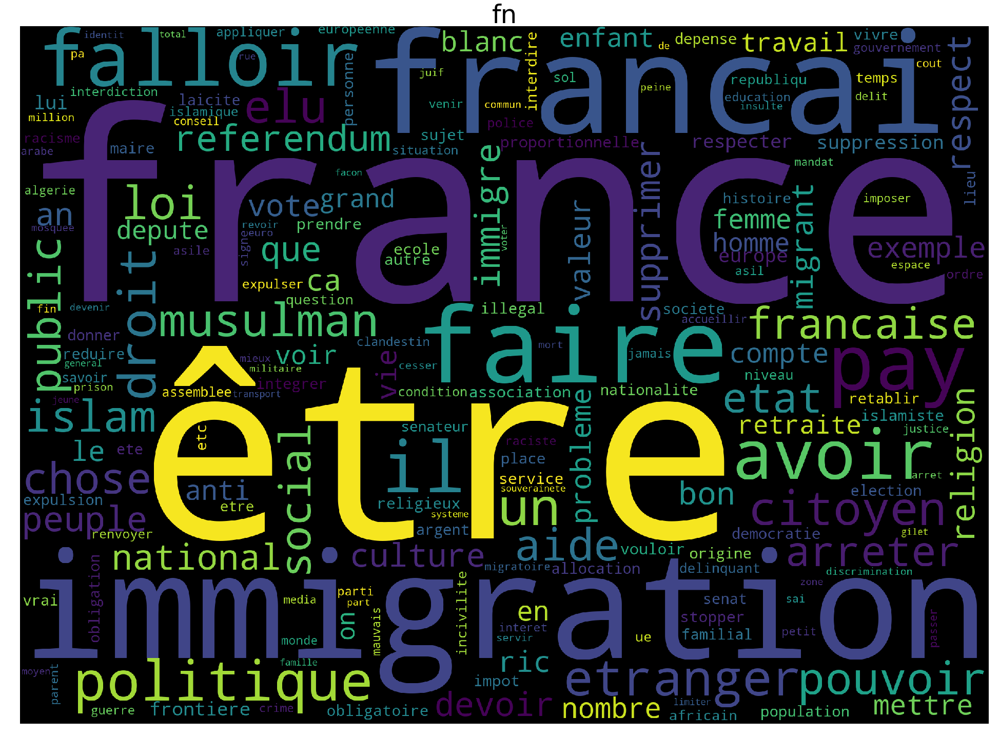

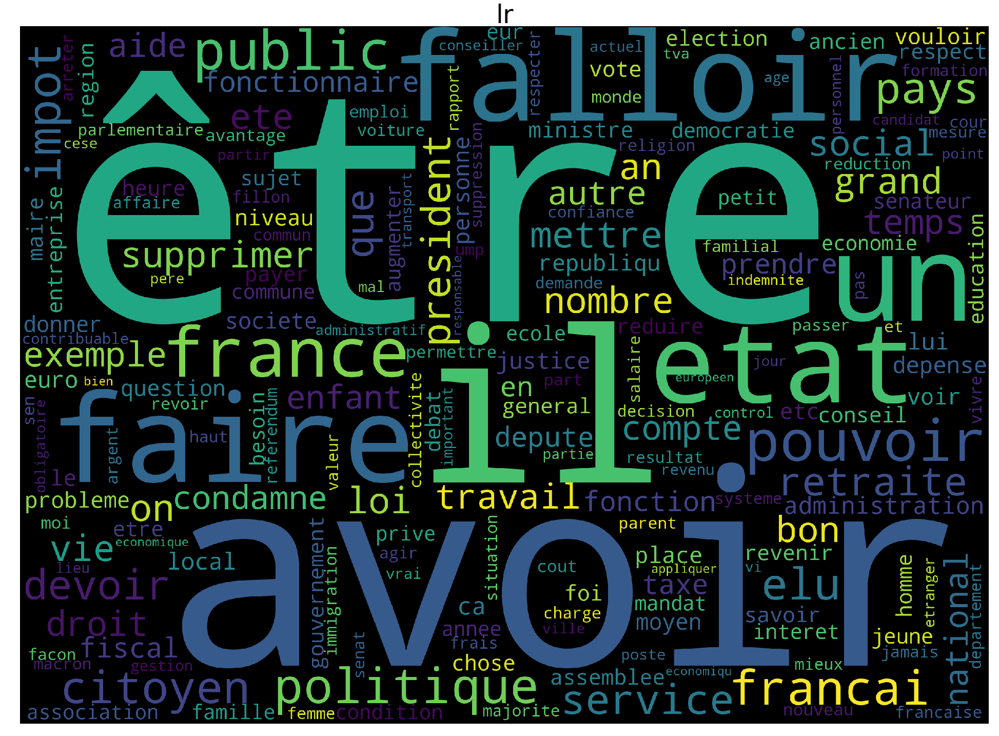

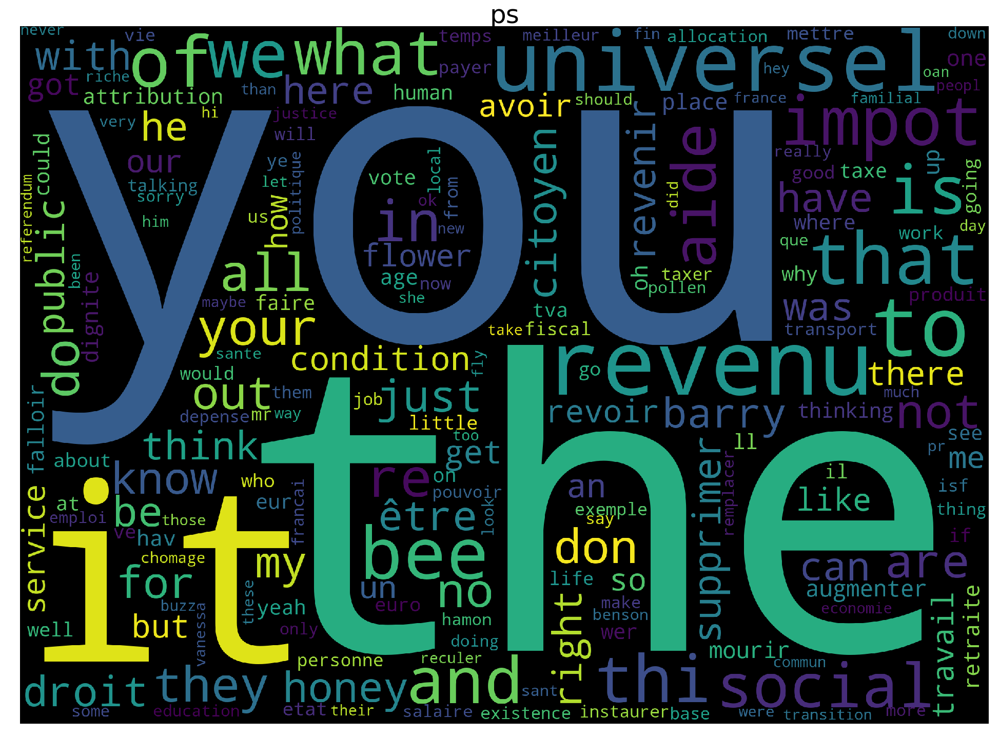

In [69]:
NLP_plots_models.wordcloud_decision(model,features_contrib_test, df_author_contrib)

#### Avec SGD :  

In [86]:
#initialisation du modèle :
model=SGDClassifier()

In [87]:
#On fit le modèle :
model.fit(features_contrib_train, labels)

SGDClassifier(alpha=0.0001, average=False, class_weight=None,
              early_stopping=False, epsilon=0.1, eta0=0.0, fit_intercept=True,
              l1_ratio=0.15, learning_rate='optimal', loss='hinge',
              max_iter=1000, n_iter_no_change=5, n_jobs=None, penalty='l2',
              power_t=0.5, random_state=None, shuffle=True, tol=0.001,
              validation_fraction=0.1, verbose=0, warm_start=False)

##### Application du modèle :

In [88]:
label_pred = model.predict(features_contrib_test)

##### Résultats :

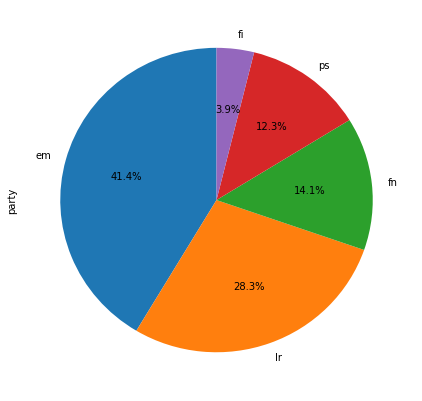

In [89]:
#Pour pouvoir utiliser la fonction, on le convertit en dataframe
d={'party' : label_pred}
label_pred=pd.DataFrame(data=d)

#On affiche le pie chart :
NLP_plots_models.partis_pie_chart(label_pred.party)

On enregistre les résultats de la classification:

In [90]:
#label_pred.to_csv('Donnees_clean/Classifications/predictions_partis_Elysee_SGD.csv', index=False)

Wordcloud:

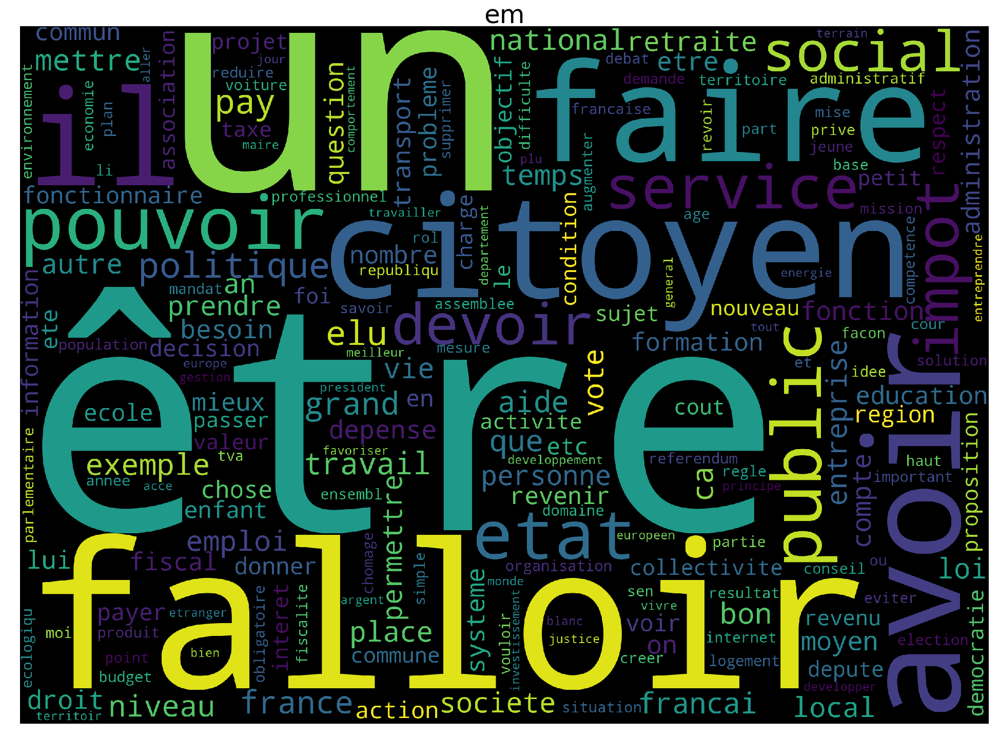

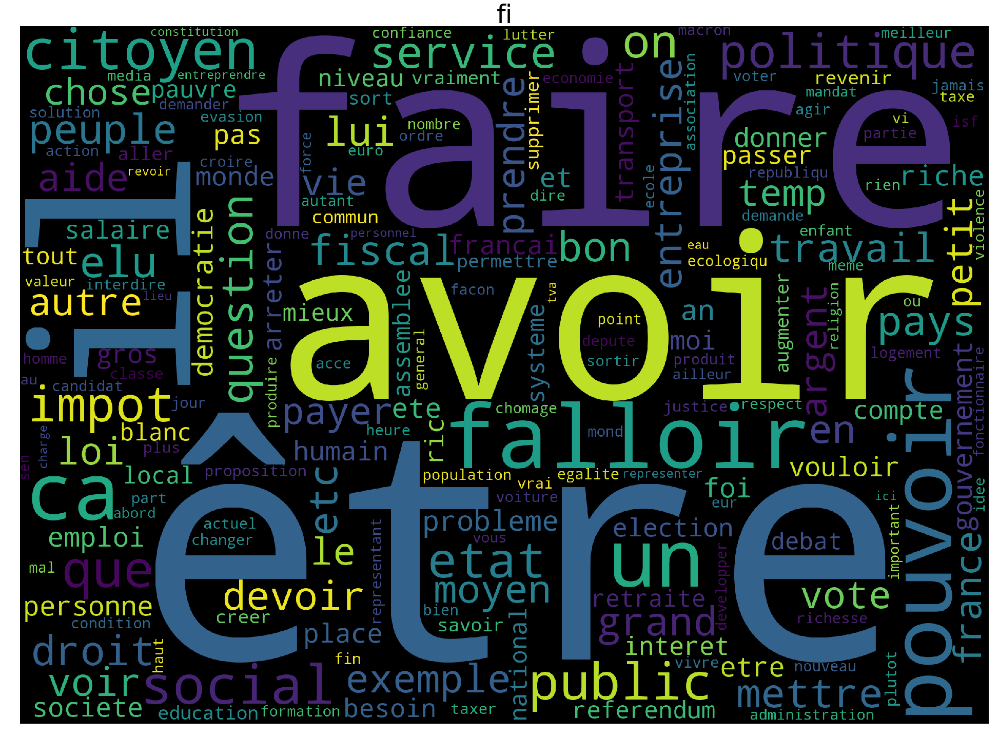

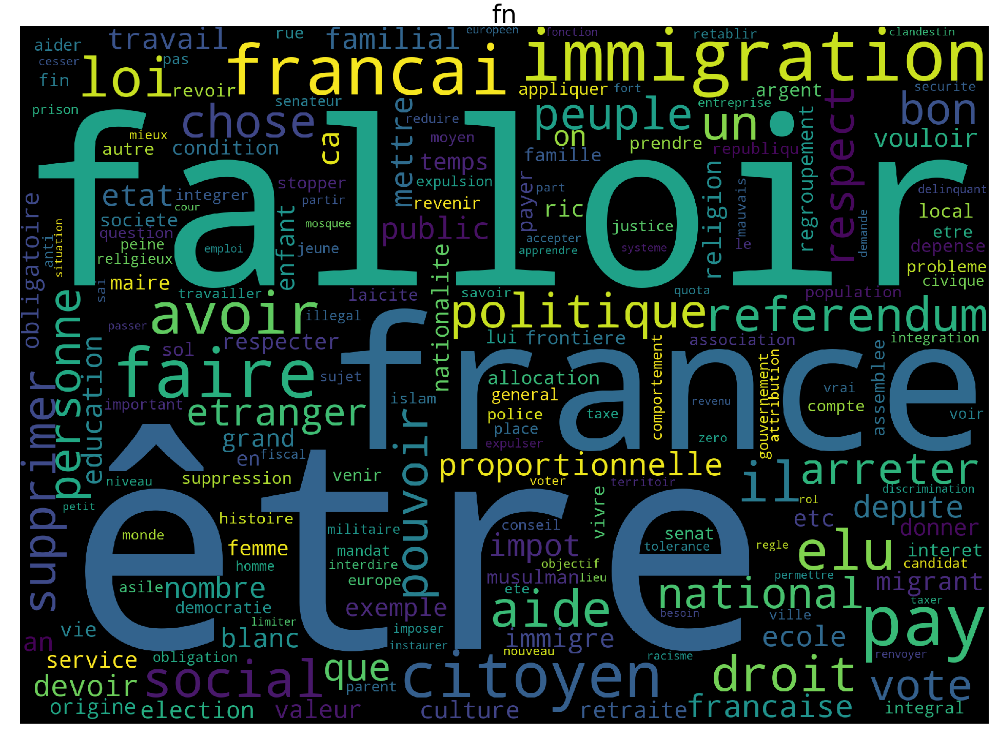

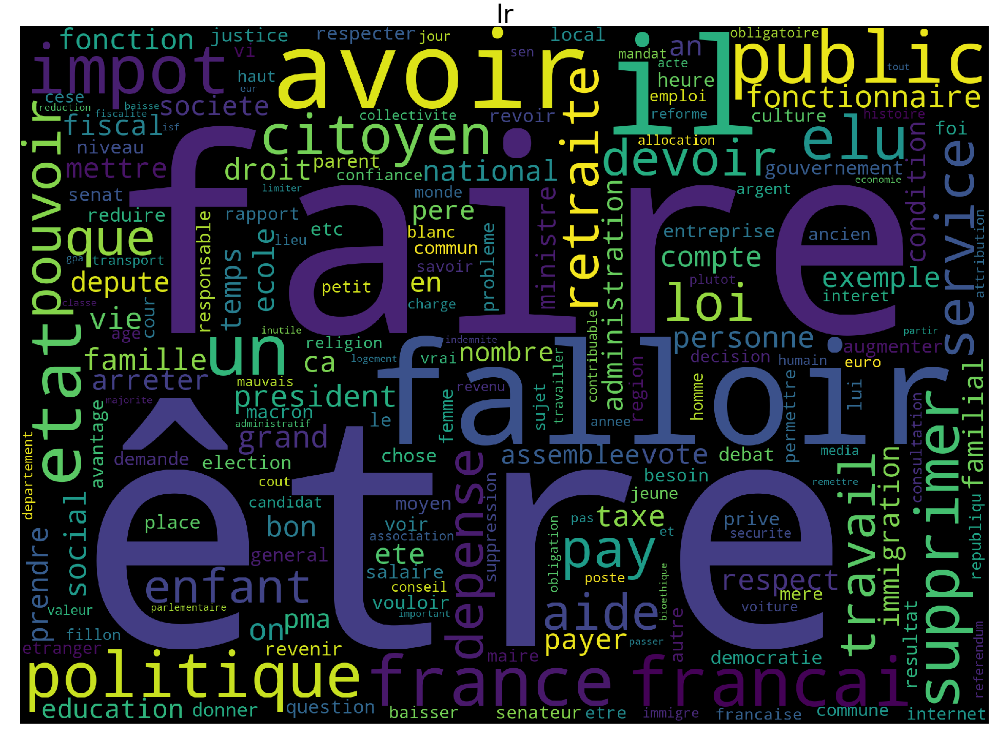

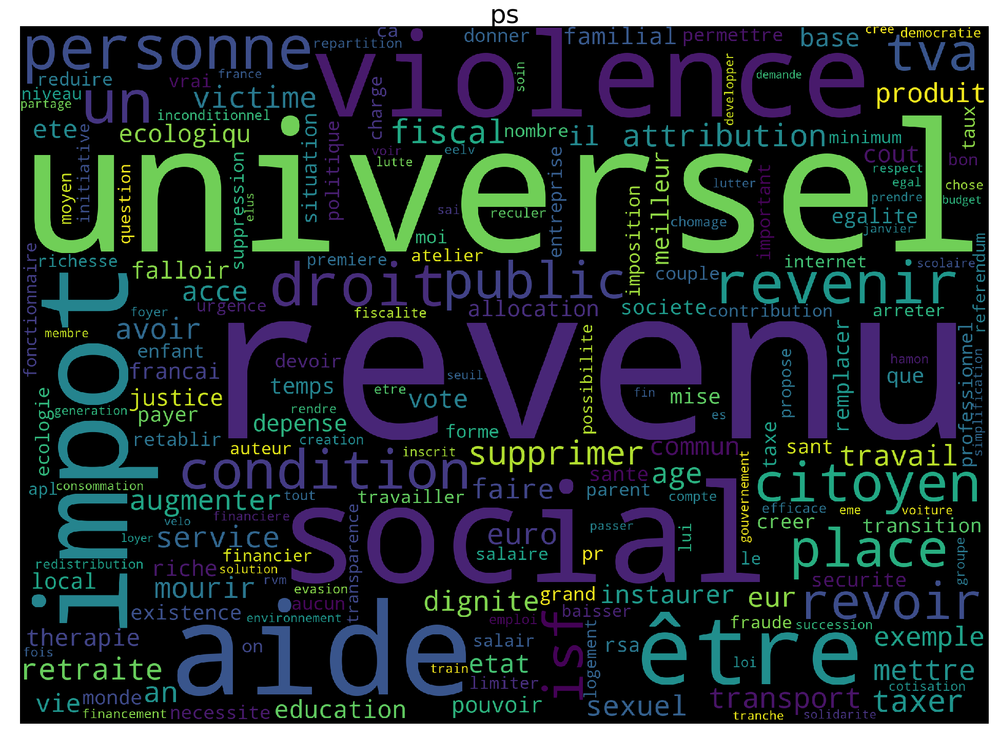

In [75]:
NLP_plots_models.wordcloud_decision(model,features_contrib_test, df_author_contrib)